In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import scanpy as sc
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib as mpl
from matplotlib.pyplot import rc_context
import os
import seaborn as sns
import importlib
import re

In [2]:
import degSummary
from scanpyColor import godsnot_102

In [68]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150, facecolor='white', dpi_save=900)

scanpy==1.9.3 anndata==0.10.8 umap==0.5.3 numpy==1.23.5 scipy==1.11.4 pandas==2.2.1 scikit-learn==1.5.1 statsmodels==0.14.2 python-igraph==0.11.6 louvain==0.8.0 pynndescent==0.5.12


In [73]:
sns.set_theme(style="ticks") #  # "ticks" "whitegrid"

# Load data

In [3]:
os.chdir('../..')

In [4]:
pwd

'/data/tcl/Project/ADFCA'

In [5]:
age_L=['10', '20', '30']
ageColor_L=['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']
ageColor_L2=['#009ACD', '#FF7D40', '#2CA02C', '#D62728']
ggplotColor3_L= ["#F8766D", "#00BA38", "#619CFF"]
set2Color_L=["#66C2A5", "#E9936A", "#A89BB0"]

In [6]:
genotype_L=['control', 'AB42', 'hTau']

In [7]:
figureFolder = 'Analysis/Figure'
os.makedirs(figureFolder, exist_ok=True)

In [8]:
figureDataFolder=f'Analysis/Figure'
os.makedirs(figureDataFolder, exist_ok=True)
figure1Folder=f'{figureDataFolder}/Figure1'
os.makedirs(figure1Folder, exist_ok=True)
figure2Folder=f'{figureDataFolder}/Figure2'
os.makedirs(figure2Folder, exist_ok=True)
figure2PicFolder=f'{figure2Folder}/pic'
os.makedirs(figure2PicFolder, exist_ok=True)

In [9]:
figure3Folder=f'{figureDataFolder}/Figure3'
os.makedirs(figure3Folder, exist_ok=True)
figure3PicFolder=f'{figure3Folder}/pic'
os.makedirs(figure3PicFolder, exist_ok=True)

In [10]:
figure5Folder=f'{figureDataFolder}/Figure5'
os.makedirs(figure5Folder, exist_ok=True)
figure5PicFolder=f'{figure5Folder}/pic'
os.makedirs(figure5PicFolder, exist_ok=True)

In [11]:
cellnFolder=f'{figure5Folder}/cellN'
os.makedirs(cellnFolder, exist_ok=True)

compositionFolder=f'{figure5Folder}/composition'
os.makedirs(compositionFolder, exist_ok=True)

In [12]:
degControlFolder=f'{figure5Folder}/DEG_toControl'
os.makedirs(degControlFolder, exist_ok=True)

degGenoAgeFolder=f'{figure5Folder}/DEG_genoAge'
os.makedirs(degGenoAgeFolder, exist_ok=True)

degCelltypeFolder=f'{figure5Folder}/DEG_celltype'
os.makedirs(degCelltypeFolder, exist_ok=True)
degSummaryFolder=f'{figure5Folder}/degSummary'
os.makedirs(degSummaryFolder, exist_ok=True)

In [13]:
### Fig5 GO: non-neuronal cells

goFolder=f'{figure5Folder}/GO_compareToControl'
os.makedirs(goFolder, exist_ok=True)

goIdFolder=f'{goFolder}/geneID'
os.makedirs(goIdFolder, exist_ok=True)
goNameFolder=f'{goFolder}/geneName'
os.makedirs(goNameFolder, exist_ok=True)

revigoFolder=f'{figure5Folder}/revigo_compareToControl'
os.makedirs(revigoFolder, exist_ok=True)


goAB42TauFolder =f'{figure5Folder}/GO_Ab42TauCommon'
os.makedirs(goAB42TauFolder, exist_ok=True)
goAB42TauIdFolder=f'{goAB42TauFolder}/geneID'
os.makedirs(goAB42TauIdFolder, exist_ok=True)
goAB42TauNameFolder=f'{goAB42TauFolder}/geneName'
os.makedirs(goAB42TauNameFolder, exist_ok=True)

In [14]:
genoAge_L = ['control_10', 'control_20', 'control_30', 'AB42_10', 'AB42_20', 'hTau_20', 'hTau_30']

In [15]:
# genoAgeSex_L = ['control_10_female', 'control_10_male', 'control_20_female', 'control_20_male', 'control_30_female', 'control_30_male', 
#                 'AB42_10_female', 'AB42_10_male', 'AB42_20_female', 'AB42_20_male', 
#                 'hTau_20_female', 'hTau_20_male', 'hTau_30_female', 'hTau_30_male']

In [16]:
genoAgeSex_L = ['control_10_female', 'control_20_female', 'control_30_female', 'control_10_male', 'control_20_male', 'control_30_male', 
                'AB42_10_female', 'AB42_20_female', 'AB42_10_male', 'AB42_20_male', 
                'hTau_20_female', 'hTau_30_female', 'hTau_20_male', 'hTau_30_male']

In [17]:
# ageCompare
genoCompare_Df = pd.DataFrame(columns=['expSet', 'controlSet', 'age'])
# genoCompare_Df['expSet'] = [exp for exp in genoAge_L if 'control' not in exp]
# genoCompare_Df['controlSet'] = pd.Categorical(['control_' + '_'.join(genoAge.split('_')[1:]) for genoAge in genoCompare_Df['expSet']])


genoCompare_Df.loc[0,:] = ['AB42', 'control_inAB42', '10,20']
genoCompare_Df.loc[1,:] = ['hTau', 'control_inTau', '20,30']
genoCompare_Df

,expSet,controlSet,age
0,AB42,control_inAB42,"10,20"
1,hTau,control_inTau,"20,30"


In [18]:
celltypeN700_L = pd.read_csv(f'{figure2Folder}/cellN/celltype_cellN_n700.csv').annotation.to_list()
celltypeN_Df=pd.read_csv(f'{figure2Folder}/cellN/celltype_cellN.csv')
celltypeN700_Df=pd.read_csv(f'{figure2Folder}/cellN/celltype_cellN_n700.csv')
len(celltypeN700_L)

102

In [19]:
adfcaTissue = 'body'

# Load adata

In [22]:
# adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
# adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [38]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v1.0/adata_adfca_head_v1.0.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v1.0/adata_adfca_body_v1.0.h5ad')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [39]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

<ipython-input-39-d569f6e12017>:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_headBody = adata_head.concatenate(adata_body, join='outer')


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'sample', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'genoAge', 'genoSex', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'adfca_annotation_group', 'adfca_annotation_subcluster', 'batch'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

# Over-representation analyzed by Enrichr using KEGG pathway

## Load fat body DEGs

### Genes from genotype differences

In [20]:
degDf = pd.read_csv(f'{figure2Folder}/DEG_genotype_toControl/adult fat body_body_hTau_control_inTau.csv')
# degDf = degDf[degDf.hTau_pvals_adj < 0.05].dropna()
degDf = degDf.rename(columns = {'hTau_names': 'Gene'})
degDf

,Gene,hTau_pvals,hTau_pvals_adj,hTau_logfoldchanges
0,glob1,0.000000e+00,0.000000e+00,2.226983
1,CadN2,0.000000e+00,0.000000e+00,5.864644
2,Lk6,5.820863e-284,1.048984e-280,0.804302
3,Act5C,1.427417e-160,4.823184e-158,2.079932
4,CG2233,6.794203e-160,2.248881e-157,0.650432
...,...,...,...,...
16214,AdipoR,1.908239e-308,4.421389e-305,-1.693644
16215,AcCoAS,0.000000e+00,0.000000e+00,-2.026020
16216,CG10082,0.000000e+00,0.000000e+00,-1.861764
16217,Lsd-2,0.000000e+00,0.000000e+00,-1.820978


In [21]:
degDf['Rank'] = -np.log10(degDf.hTau_pvals_adj)*degDf.hTau_logfoldchanges

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [22]:
degDf.sort_values(by='Rank', inplace=True, ascending=False)#.reset_index(drop=True)
degDf.reset_index(drop=True, inplace=True)
degDf

,Gene,hTau_pvals,hTau_pvals_adj,hTau_logfoldchanges,Rank
0,glob1,0.000000e+00,0.000000e+00,2.226983,inf
1,CadN2,0.000000e+00,0.000000e+00,5.864644,inf
2,Act5C,1.427417e-160,4.823184e-158,2.079932,327.208047
3,NK7.1,8.970981e-146,2.552638e-143,2.200786,313.816688
4,SPH93,1.723417e-84,2.010943e-82,3.747512,306.159015
...,...,...,...,...,...
16214,CG42540,1.936054e-106,3.340518e-104,-5.448289,-563.768209
16215,AcCoAS,0.000000e+00,0.000000e+00,-2.026020,-inf
16216,CG10082,0.000000e+00,0.000000e+00,-1.861764,-inf
16217,Lsd-2,0.000000e+00,0.000000e+00,-1.820978,-inf


In [23]:
degs_sig = degDf[degDf.hTau_pvals_adj < 0.05]
degs_up = degs_sig[degs_sig.hTau_logfoldchanges > 0]
degs_dw = degs_sig[degs_sig.hTau_logfoldchanges < 0]

In [24]:
degs_up

,Gene,hTau_pvals,hTau_pvals_adj,hTau_logfoldchanges,Rank
0,glob1,0.000000e+00,0.000000e+00,2.226983,inf
1,CadN2,0.000000e+00,0.000000e+00,5.864644,inf
2,Act5C,1.427417e-160,4.823184e-158,2.079932,327.208047
3,NK7.1,8.970981e-146,2.552638e-143,2.200786,313.816688
4,SPH93,1.723417e-84,2.010943e-82,3.747512,306.159015
...,...,...,...,...,...
623,aralar1,5.525851e-04,4.517327e-03,0.118873,0.278770
669,Tomosyn,6.638506e-03,4.506904e-02,0.125517,0.168962
733,kra,2.546212e-03,1.879700e-02,0.032708,0.056451
740,lqf,2.661205e-05,2.541936e-04,0.013534,0.048652


### Genes from genoAge differences

In [25]:
degDf_20 = pd.read_csv(f'{figure2Folder}/DEG_toControl_GenoAge/adult fat body_body_hTau_control_inTau_20.csv')
degDf_30 = pd.read_csv(f'{figure2Folder}/DEG_toControl_GenoAge/adult fat body_body_hTau_control_inTau_30.csv')
# degDf = degDf[degDf.hTau_pvals_adj < 0.05].dropna()
degDf_20 = degDf_20.rename(columns = {'hTau_20_names': 'Gene'})
degDf_30 = degDf_30.rename(columns = {'hTau_30_names': 'Gene'})
degDf_20

,Gene,hTau_20_pvals,hTau_20_pvals_adj,hTau_20_logfoldchanges
0,glob1,1.109459e-264,8.997156e-261,2.365431
1,CadN2,3.610311e-183,9.759272e-180,5.791273
2,Lk6,9.833102e-99,4.983846e-96,0.510792
3,Act5C,6.745101e-60,1.163817e-57,2.068049
4,TotC,1.275623e-51,1.638418e-49,4.060164
...,...,...,...,...
16214,FASN1,2.704394e-170,6.266082e-167,-1.576166
16215,Lsd-2,6.601394e-190,2.141360e-186,-1.742075
16216,lncRNA:Hsromega,1.855545e-205,7.523770e-202,-1.586067
16217,CG10082,3.578529e-209,1.934672e-205,-1.935313


In [26]:
degDf_30

,Gene,hTau_30_pvals,hTau_30_pvals_adj,hTau_30_logfoldchanges
0,CadN2,1.205985e-187,1.955987e-183,5.672348
1,glob1,3.195372e-180,2.591287e-176,2.278563
2,Lk6,2.315673e-138,7.511581e-135,1.091616
3,NK7.1,1.617159e-90,1.748580e-87,2.224033
4,drpr,1.799886e-77,1.326925e-74,1.826645
...,...,...,...,...
16214,retm,2.511768e-104,5.092296e-101,-1.920125
16215,CG3036,1.516068e-108,3.512729e-105,-2.561732
16216,Gpdh1,1.343536e-121,3.631802e-118,-2.155439
16217,path,9.786257e-148,3.968082e-144,-1.747951


In [27]:
degDf_20['Rank'] = -np.log10(degDf_20.hTau_20_pvals_adj)*degDf_20.hTau_20_logfoldchanges
degDf_30['Rank'] = -np.log10(degDf_30.hTau_30_pvals_adj)*degDf_30.hTau_30_logfoldchanges

In [28]:
degDf_20.sort_values(by='Rank', inplace=True, ascending=False)#.reset_index(drop=True)
degDf_20.reset_index(drop=True, inplace=True)

degDf_30.sort_values(by='Rank', inplace=True, ascending=False)#.reset_index(drop=True)
degDf_30.reset_index(drop=True, inplace=True)

degDf_20

,Gene,hTau_20_pvals,hTau_20_pvals_adj,hTau_20_logfoldchanges,Rank
0,CadN2,3.610311e-183,9.759272e-180,5.791273,1036.699154
1,glob1,1.109459e-264,8.997156e-261,2.365431,615.120517
2,SPH93,2.732119e-40,2.110106e-38,7.015258,264.304725
3,TotC,1.275623e-51,1.638418e-49,4.060164,198.077436
4,CG31465,3.606381e-46,3.633037e-44,4.114868,178.748742
...,...,...,...,...,...
16214,lncRNA:Hsromega,1.855545e-205,7.523770e-202,-1.586067,-318.995469
16215,Lsd-2,6.601394e-190,2.141360e-186,-1.742075,-323.449808
16216,CG10082,3.578529e-209,1.934672e-205,-1.935313,-396.184408
16217,CG42540,2.897799e-70,6.527694e-68,-6.458437,-433.911668


In [29]:
degs20_sig = degDf_20[degDf_20.hTau_20_pvals_adj < 0.05]
degs20_up = degs20_sig[degs20_sig.hTau_20_logfoldchanges > 0]
degs20_dw = degs20_sig[degs20_sig.hTau_20_logfoldchanges < 0]

degs30_sig = degDf_30[degDf_30.hTau_30_pvals_adj < 0.05]
degs30_up = degs30_sig[degs30_sig.hTau_30_logfoldchanges > 0]
degs30_dw = degs30_sig[degs30_sig.hTau_30_logfoldchanges < 0]

In [30]:
degs20_up

,Gene,hTau_20_pvals,hTau_20_pvals_adj,hTau_20_logfoldchanges,Rank
0,CadN2,3.610311e-183,9.759272e-180,5.791273,1036.699154
1,glob1,1.109459e-264,8.997156e-261,2.365431,615.120517
2,SPH93,2.732119e-40,2.110106e-38,7.015258,264.304725
3,TotC,1.275623e-51,1.638418e-49,4.060164,198.077436
4,CG31465,3.606381e-46,3.633037e-44,4.114868,178.748742
...,...,...,...,...,...
329,Cirl,7.885074e-04,7.065636e-03,0.238215,0.512365
335,Moe,4.384536e-03,3.405785e-02,0.309425,0.454169
337,CG6051,3.229852e-03,2.561612e-02,0.285183,0.453865
400,kra,3.793061e-04,3.589245e-03,0.077059,0.188408


## Over-representation analysis (Enrichr API

In [33]:
import gseapy as gp

In [34]:
keggFolder = '/data/tcl/Resource/KEGG/Fly'

In [35]:
# read gmt file into dict
kegg = gp.read_gmt(f'{keggFolder}/kegg_fly_pathway_FlyBase631Name.gmt')

In [31]:
# Enricr API
enr_up = gp.enrichr(degs_up.Gene,
                    gene_sets=kegg,
                    outdir=None)

In [32]:
# trim (go:...)
enr_up.res2d.Term = enr_up.res2d.Term.str.split(" \(GO").str[0]

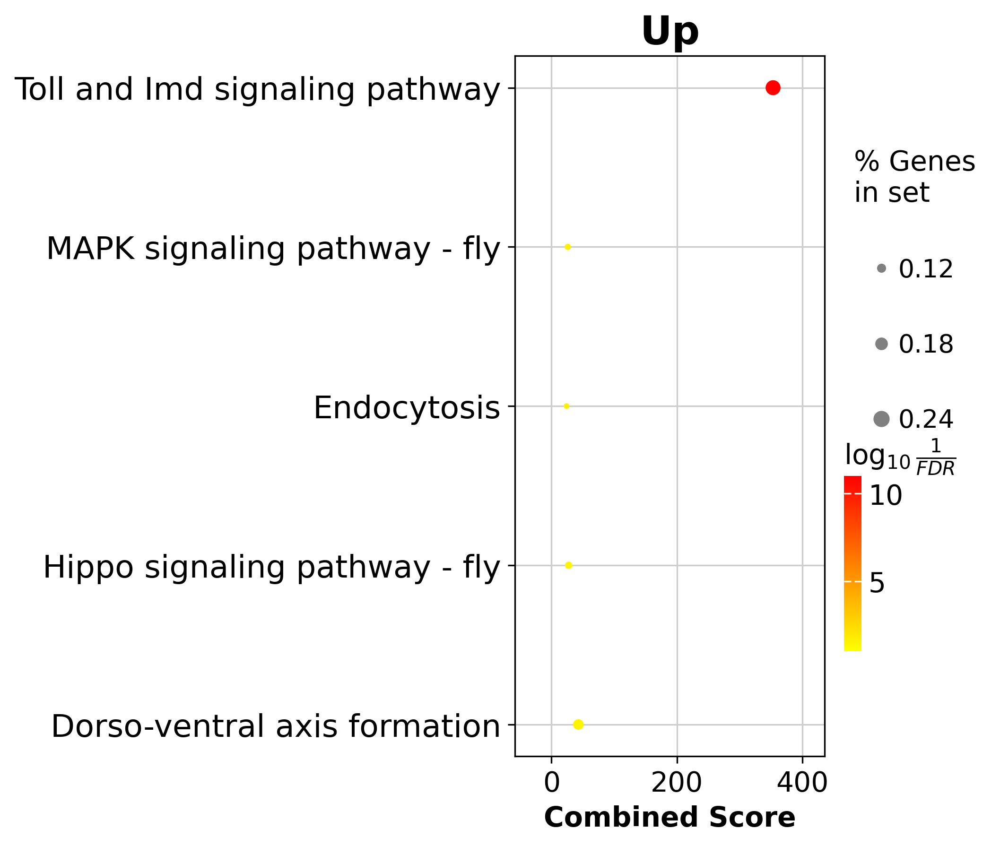

In [38]:
# dotplot
gp.dotplot(enr_up.res2d, figsize=(3.5, 6.5), title="Up", cmap = plt.cm.autumn_r)
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_up.pdf', bbox_inches='tight')
plt.show()

In [33]:
enr_dw = gp.enrichr(degs_dw.Gene,
                    gene_sets=kegg,
                    outdir=None)

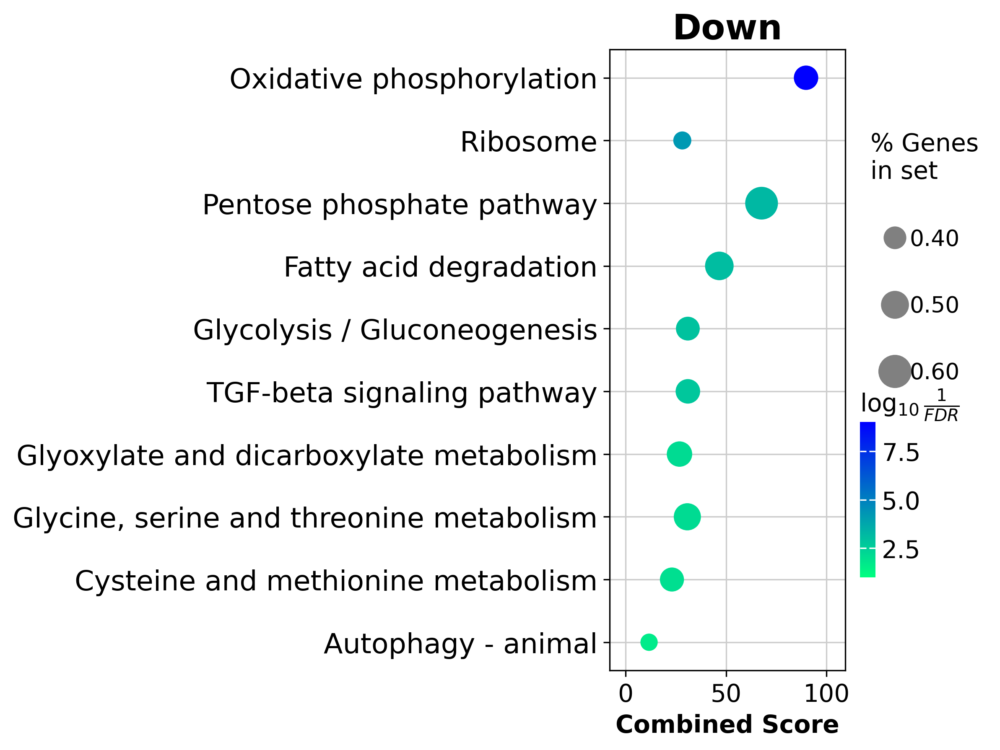

In [39]:
enr_dw.res2d.Term = enr_dw.res2d.Term.str.split(" \(GO").str[0]
gp.dotplot(enr_dw.res2d,
           figsize=(3, 6.5),
           title="Down",
           cmap = plt.cm.winter_r,
           size=5, 
           # top_term=20
          )
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_down.pdf', bbox_inches='tight')
plt.show()

## Over-representation analysis (Enrichr API), grouped by genoAge

In [46]:
import gseapy as gp

In [47]:
keggFolder = '/data/tcl/Resource/KEGG/Fly'

In [48]:
# read gmt file into dict
kegg = gp.read_gmt(f'{keggFolder}/kegg_fly_pathway_FlyBase631Name.gmt')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


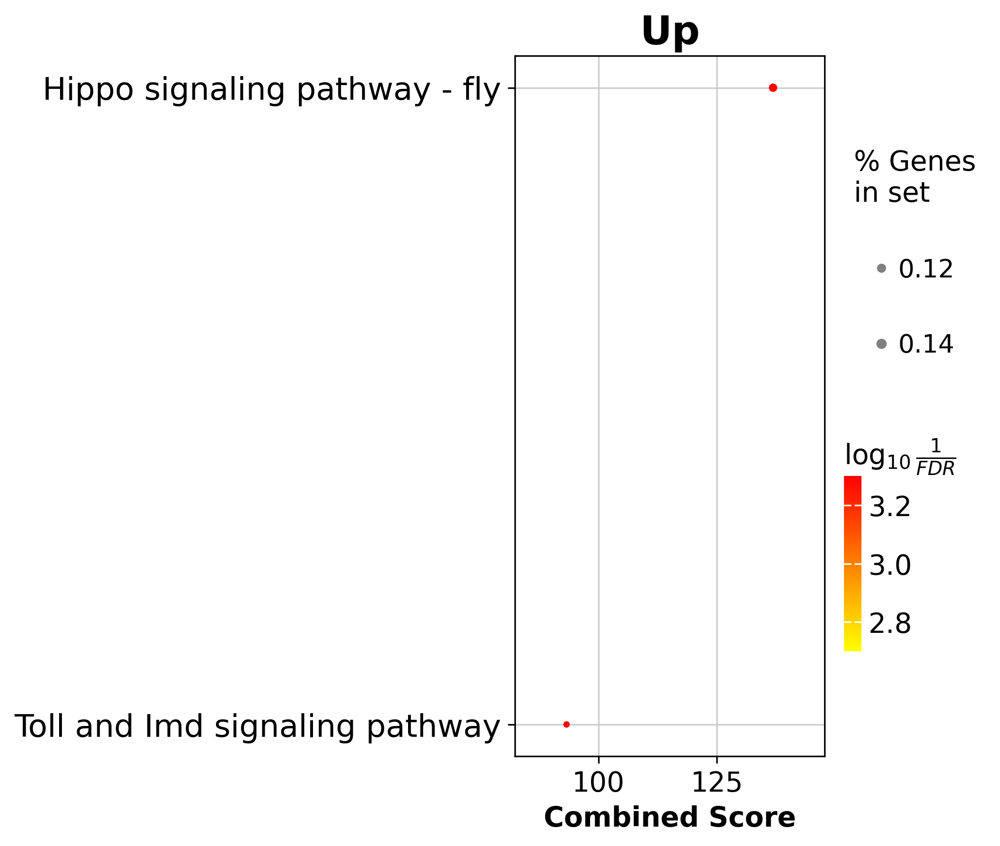

In [49]:
### degs20_up

# Enricr API
enr_up = gp.enrichr(degs20_up.Gene,
                    gene_sets=kegg,
                    outdir=None)

# trim (go:...)
enr_up.res2d.Term = enr_up.res2d.Term.str.split(" \(GO").str[0]


# dotplot
gp.dotplot(enr_up.res2d, figsize=(3.5, 6.5), title="Up", cmap = plt.cm.autumn_r)
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_degs20_up.pdf', bbox_inches='tight')
plt.show()

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


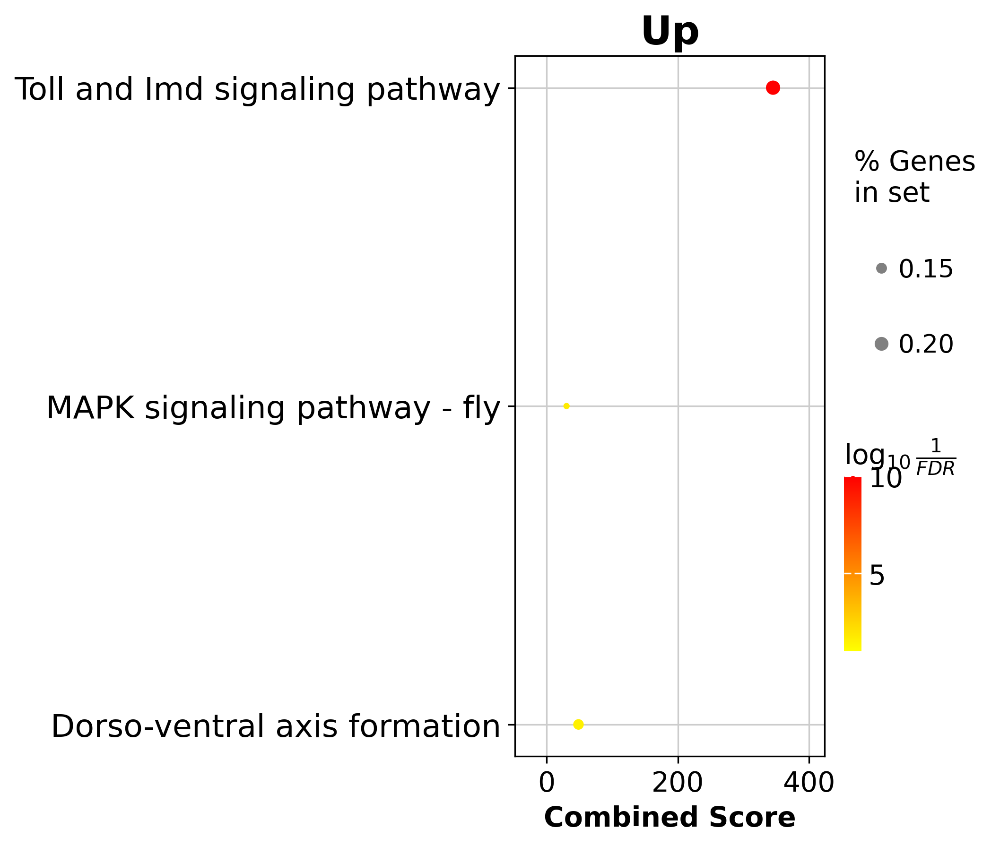

In [50]:
### degs30_up

# Enricr API
enr_up = gp.enrichr(degs30_up.Gene,
                    gene_sets=kegg,
                    outdir=None)

# trim (go:...)
enr_up.res2d.Term = enr_up.res2d.Term.str.split(" \(GO").str[0]


# dotplot
gp.dotplot(enr_up.res2d, figsize=(3.5, 6.5), title="Up", cmap = plt.cm.autumn_r)
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_degs30_up.pdf', bbox_inches='tight')
plt.show()

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


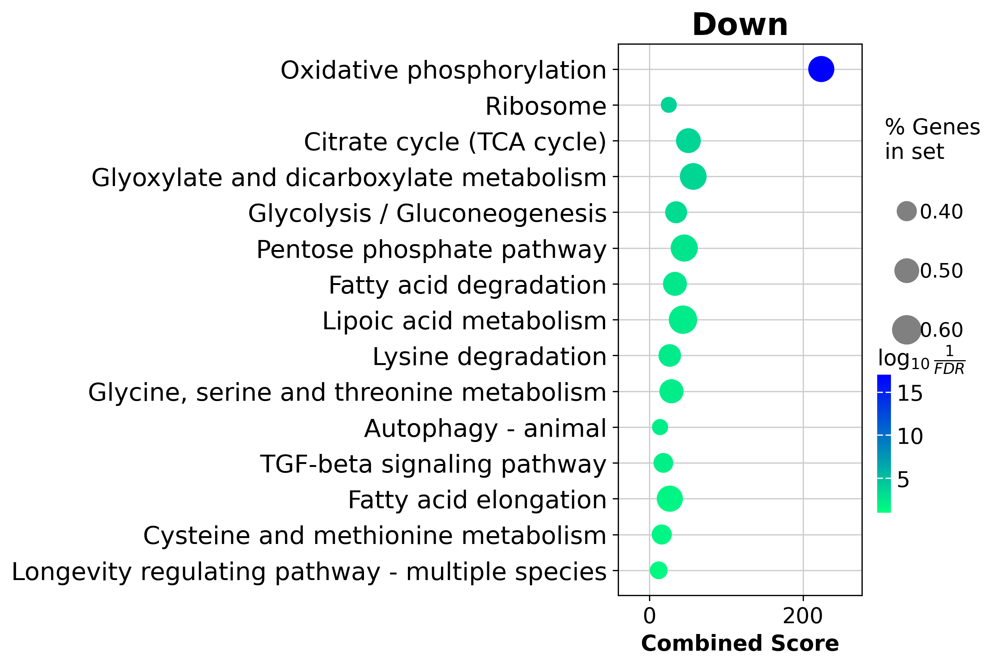

In [51]:
### degs20_dw

# Enricr API
enr_dw = gp.enrichr(degs20_dw.Gene,
                    gene_sets=kegg,
                    outdir=None)

# trim (go:...)
enr_dw.res2d.Term = enr_dw.res2d.Term.str.split(" \(GO").str[0]


# dotplot
gp.dotplot(enr_dw.res2d, figsize=(3.5, 6.5), title="Down", cmap = plt.cm.winter_r, top_term=30)
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_degs20_dw.pdf', bbox_inches='tight')
plt.show()

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/gseapy/plot.py:689: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


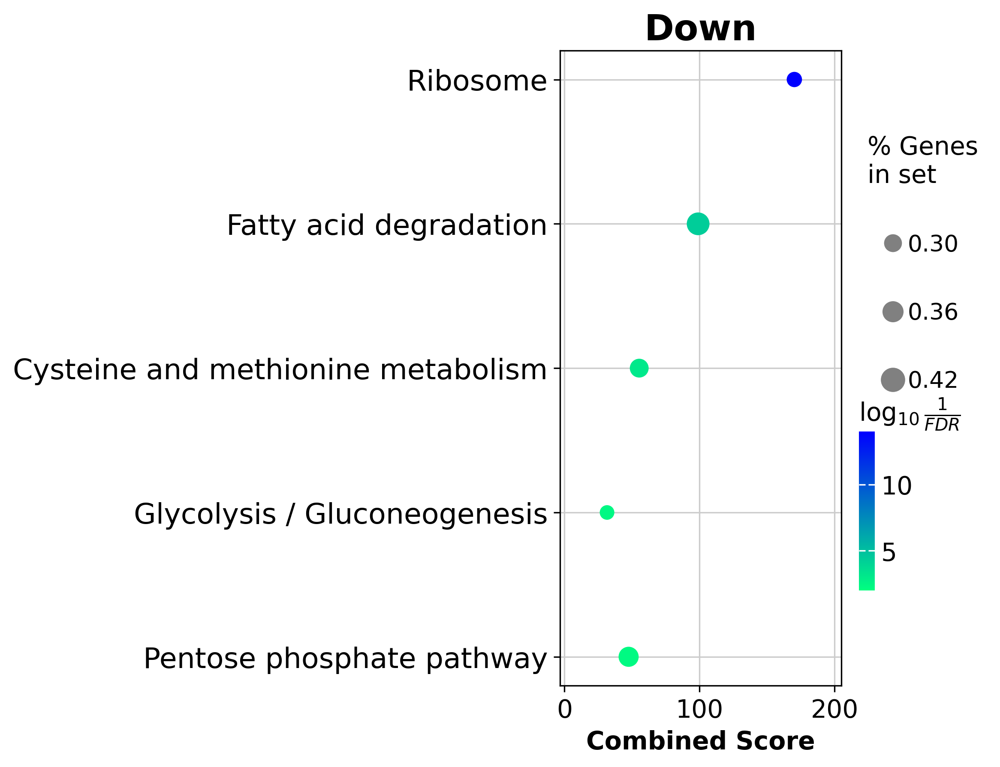

In [53]:
### degs30_dw

# Enricr API
enr_dw = gp.enrichr(degs30_dw.Gene,
                    gene_sets=kegg,
                    outdir=None)

# trim (go:...)
enr_dw.res2d.Term = enr_dw.res2d.Term.str.split(" \(GO").str[0]


# dotplot
gp.dotplot(enr_dw.res2d, figsize=(3.5, 6.5), title="Down", cmap = plt.cm.winter_r,)
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_degs30_dw.pdf', bbox_inches='tight')
plt.show()

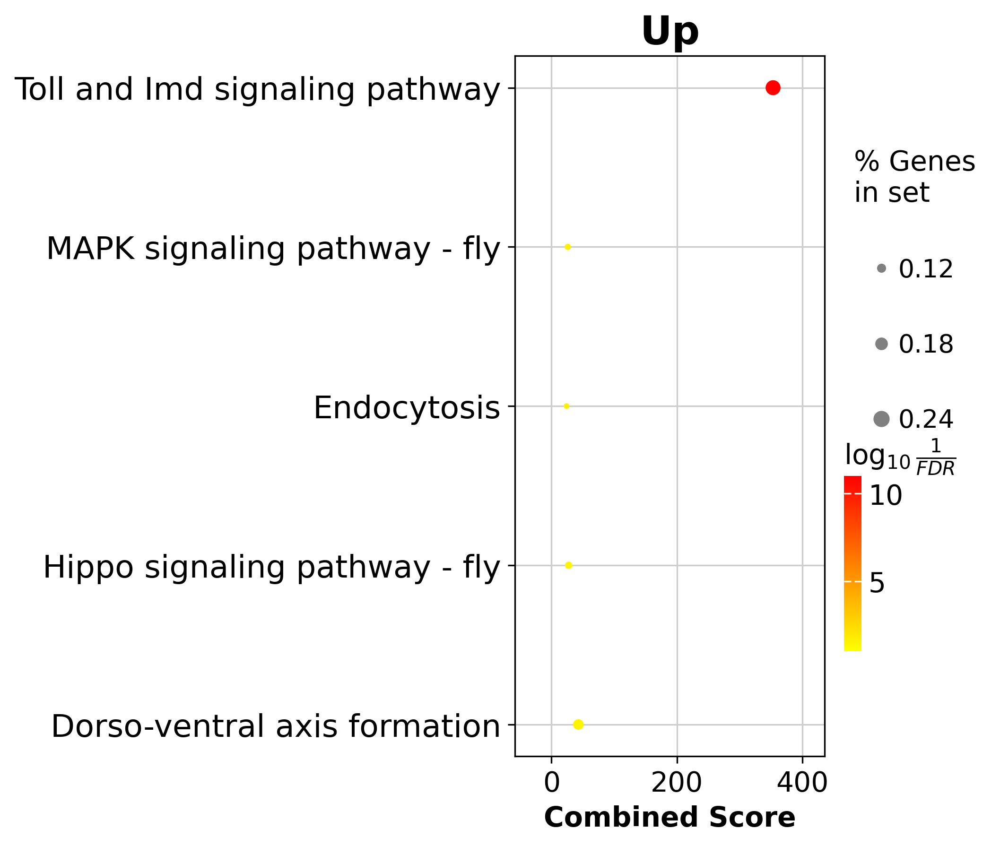

In [33]:
enr_dw = gp.enrichr(degs_dw.Gene,
                    gene_sets=kegg,
                    outdir=None)

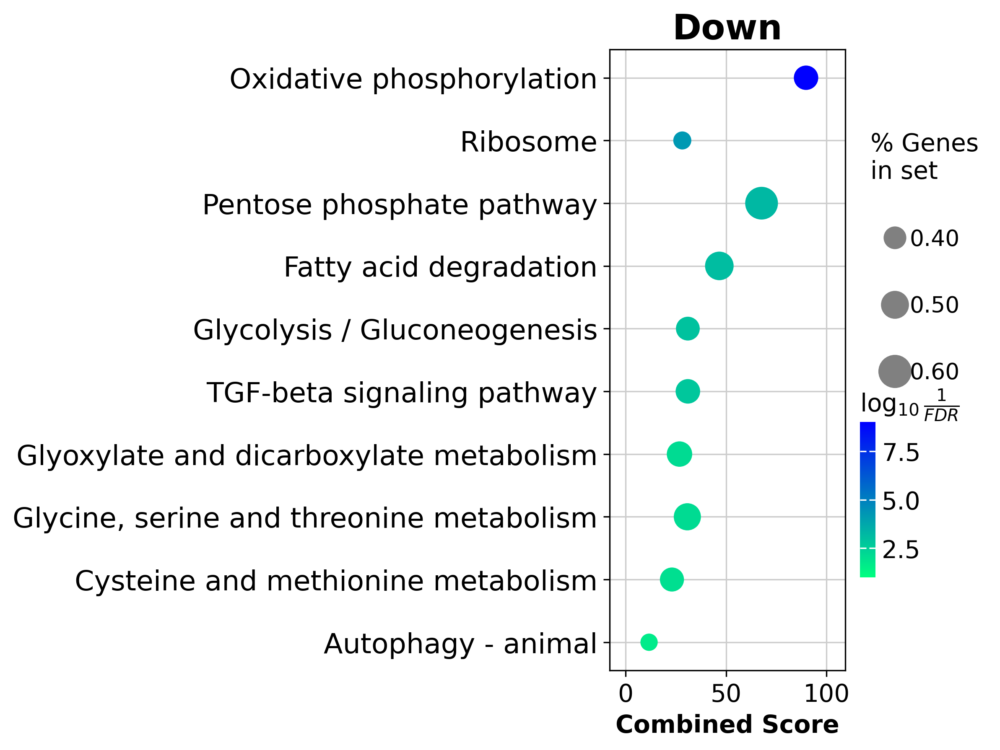

In [39]:
enr_dw.res2d.Term = enr_dw.res2d.Term.str.split(" \(GO").str[0]
gp.dotplot(enr_dw.res2d,
           figsize=(3, 6.5),
           title="Down",
           cmap = plt.cm.winter_r,
           size=5, 
           # top_term=20
          )
plt.savefig(f'{figure5PicFolder}/KEGG_pathway_enrichr_fatBody_down.pdf', bbox_inches='tight')
plt.show()

## Plot single-cell data

In [41]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150, facecolor='white', dpi_save=900)

scanpy==1.9.3 anndata==0.10.8 umap==0.5.3 numpy==1.23.5 scipy==1.11.4 pandas==2.2.1 scikit-learn==1.5.1 statsmodels==0.14.2 python-igraph==0.11.6 louvain==0.8.0 pynndescent==0.5.12


In [36]:
fattyTerm_L = [term for term in kegg.keys() if 'Fatty acid' in term]
fattyGenes_D = {term: kegg[term] for term in kegg.keys() if 'Fatty acid' in term}
fattyTerm_L

['Fatty acid biosynthesis', 'Fatty acid elongation', 'Fatty acid degradation']

### with AB42

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


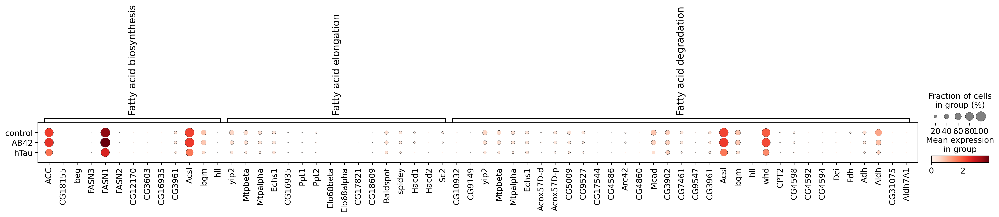

In [35]:
sc.pl.dotplot(adata_body[adata_body.obs.adfca_annotation == 'adult fat body_body'], fattyGenes_D, groupby='genotype', 
              save='_fatBody_KEGG_fattyAcid_genotype.pdf')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

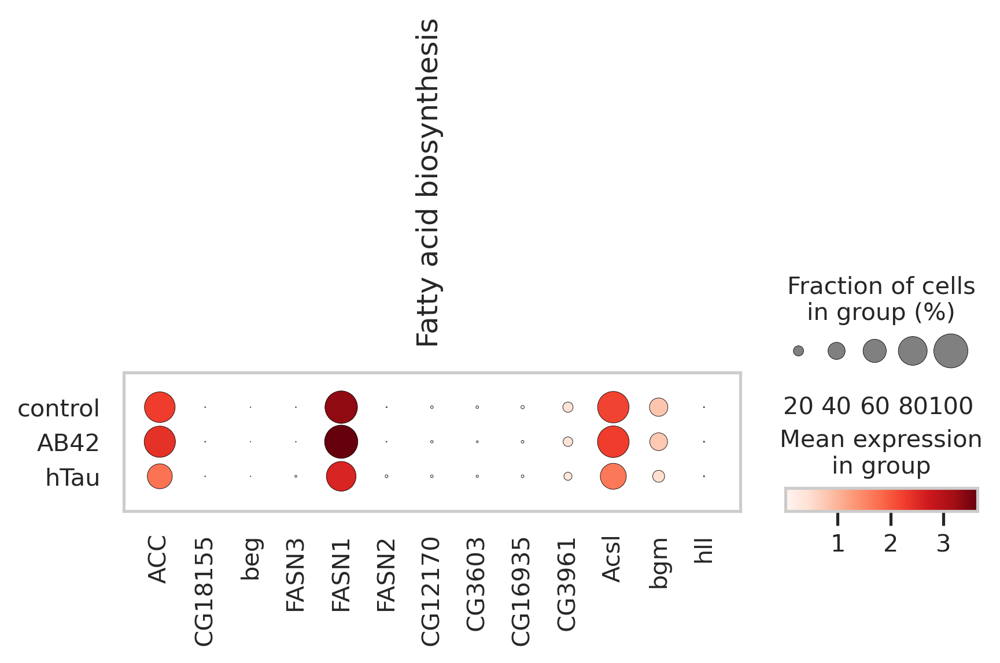

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

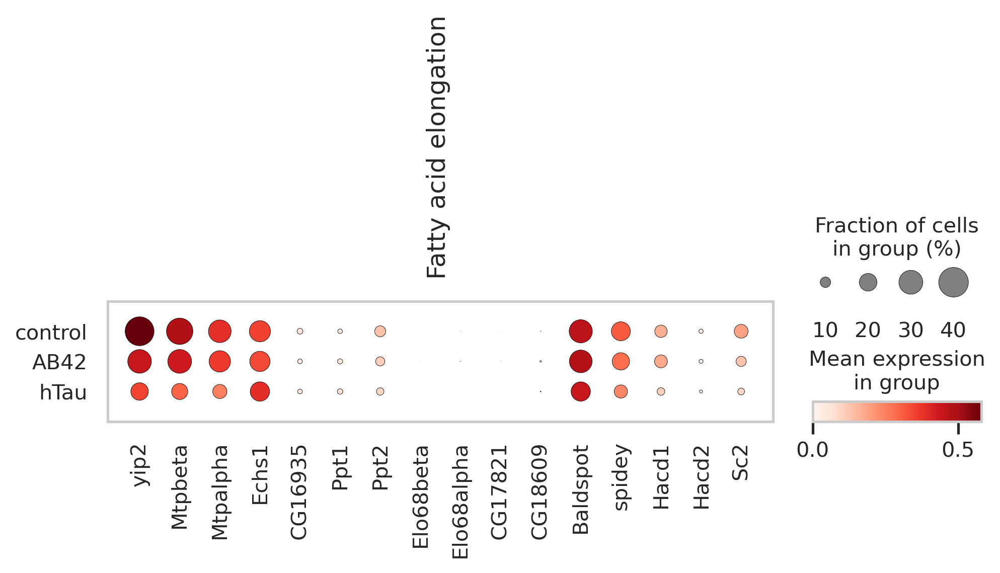

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

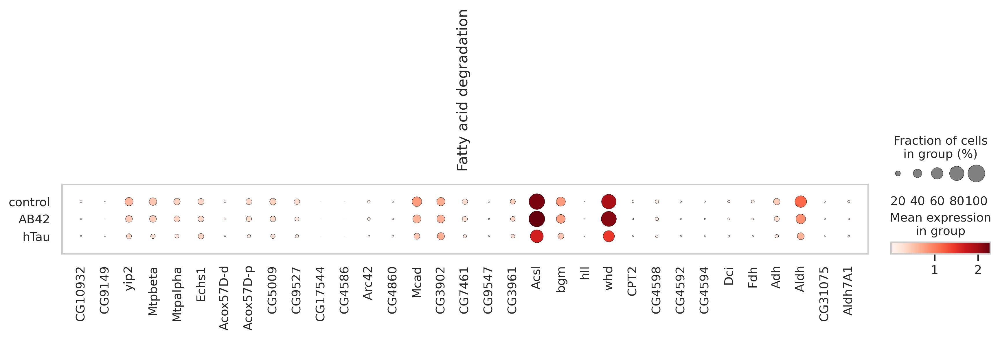

In [41]:
for kegg in fattyTerm_L:
    kegg_D = {kegg: fattyGenes_D[kegg]}
    sc.pl.dotplot(adata_body[adata_body.obs.adfca_annotation == 'adult fat body_body'], kegg_D, groupby='genotype', 
                  save= f'_fatBody_KEGG_fattyAcid_genotype_{kegg}.pdf')

for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

### without AB42

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

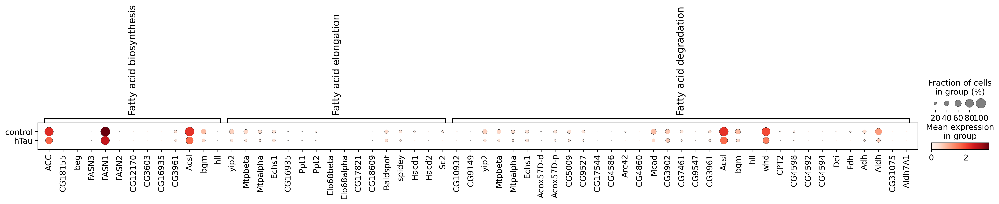

In [42]:
sc.pl.dotplot(adata_body[ (adata_body.obs.adfca_annotation == 'adult fat body_body') & (adata_body.obs.genotype != 'AB42') ], fattyGenes_D, groupby='genotype', 
              save='_fatBody_KEGG_fattyAcid_genotype_woAB42.pdf')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

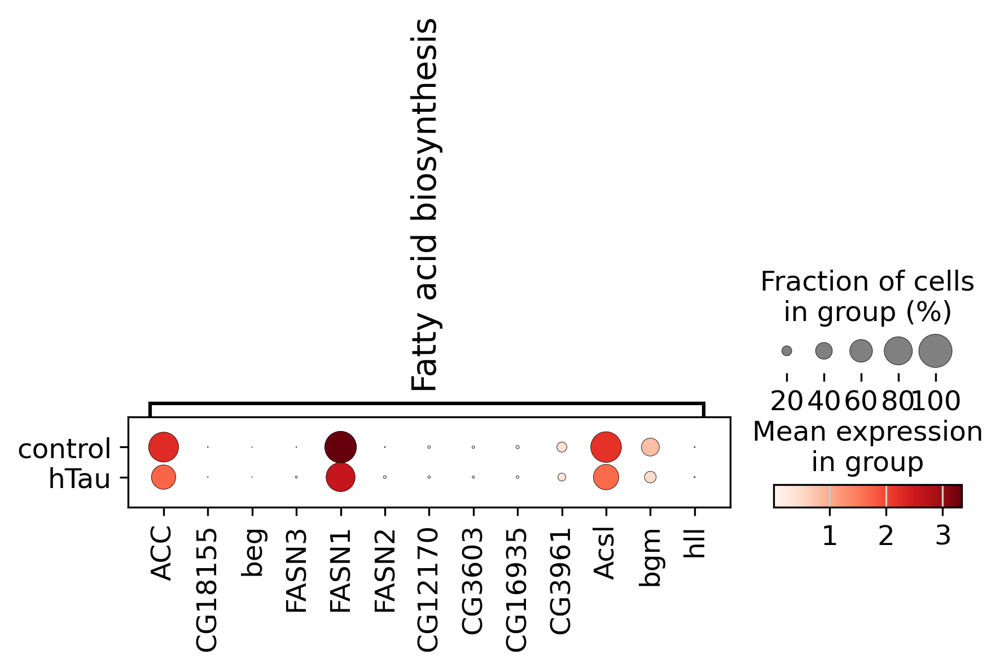

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

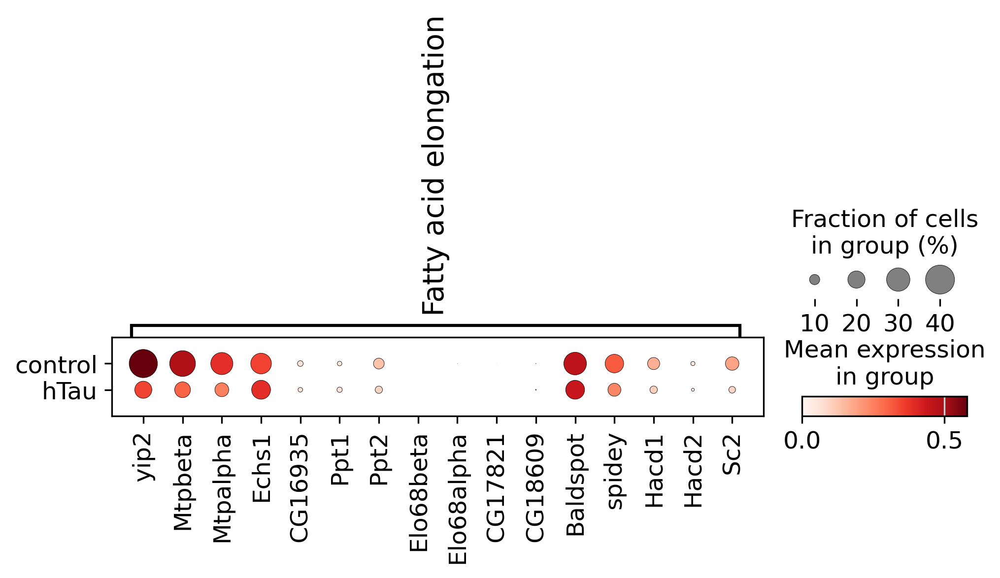

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

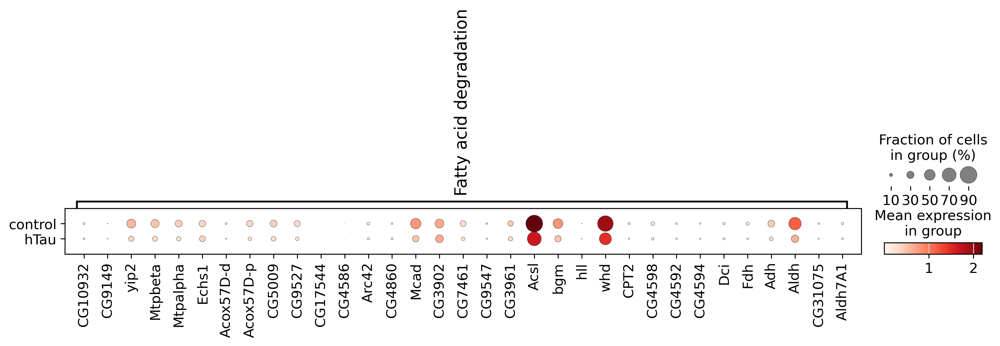

In [44]:
for kegg in fattyTerm_L:
    kegg_D = {kegg: fattyGenes_D[kegg]}
    sc.pl.dotplot(adata_body[ (adata_body.obs.adfca_annotation == 'adult fat body_body') & (adata_body.obs.genotype != 'AB42') ], kegg_D, groupby='genotype', 
                  save= f'_fatBody_KEGG_fattyAcid_genotype_{kegg}_woAB42.pdf')

for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

In [45]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

### without AB42, grouped by genoAge

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

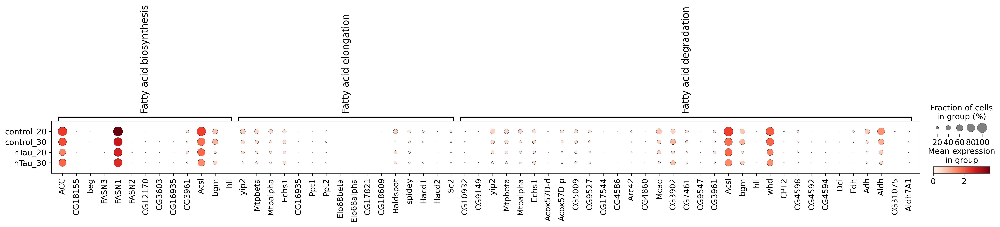

In [55]:
sc.pl.dotplot(adata_body[ (adata_body.obs.adfca_annotation == 'adult fat body_body') & (adata_body.obs.genotype != 'AB42') & (adata_body.obs.age != '10') ], fattyGenes_D, groupby='genoAge', 
              save='_fatBody_KEGG_fattyAcid_genoAge_woAB42.pdf')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

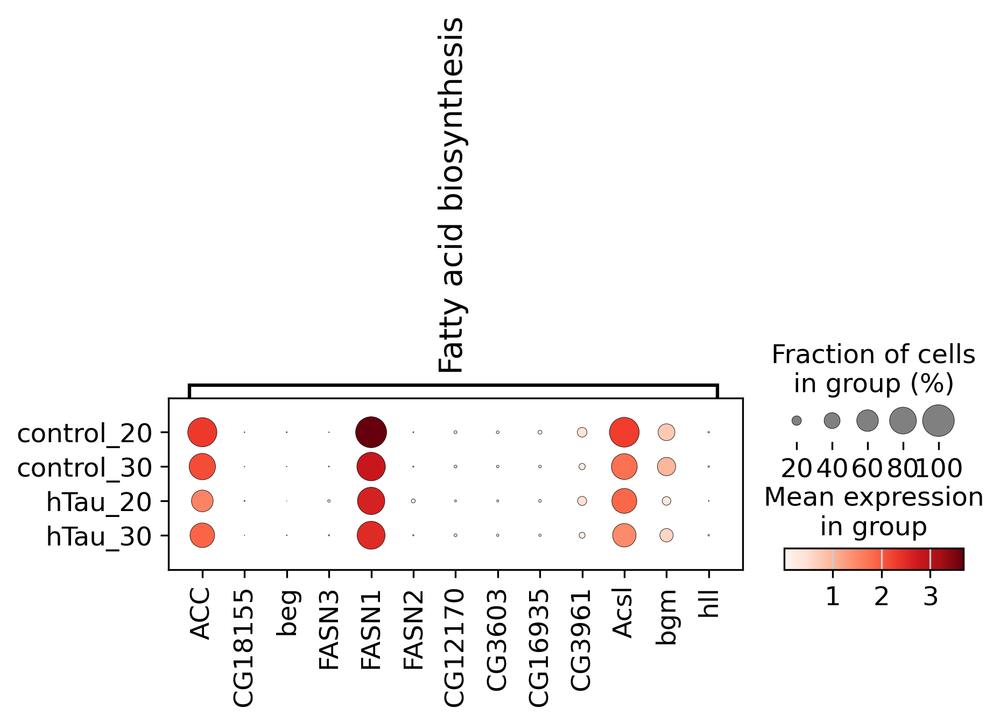

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

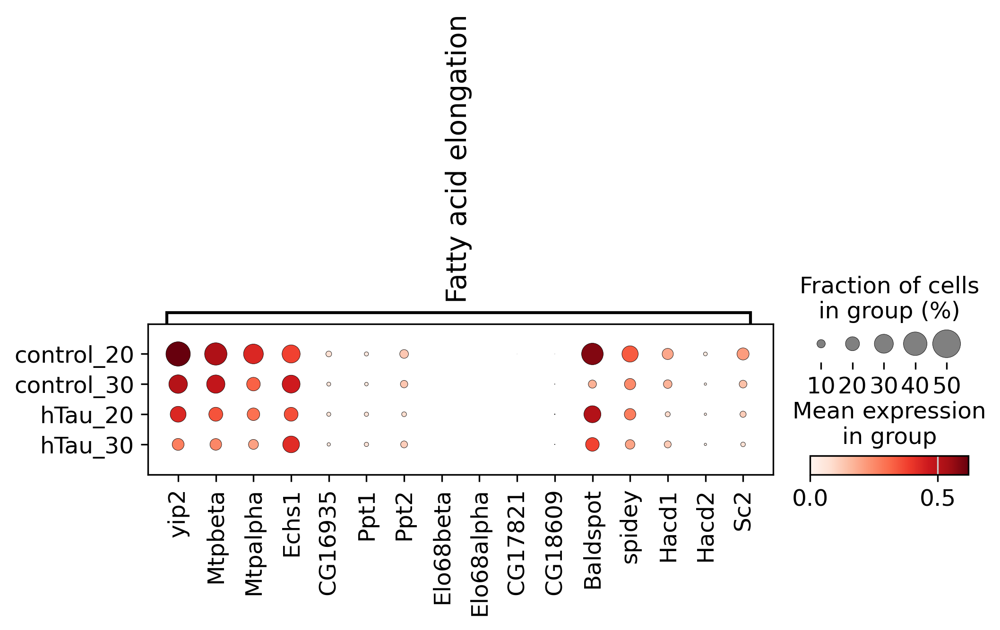

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

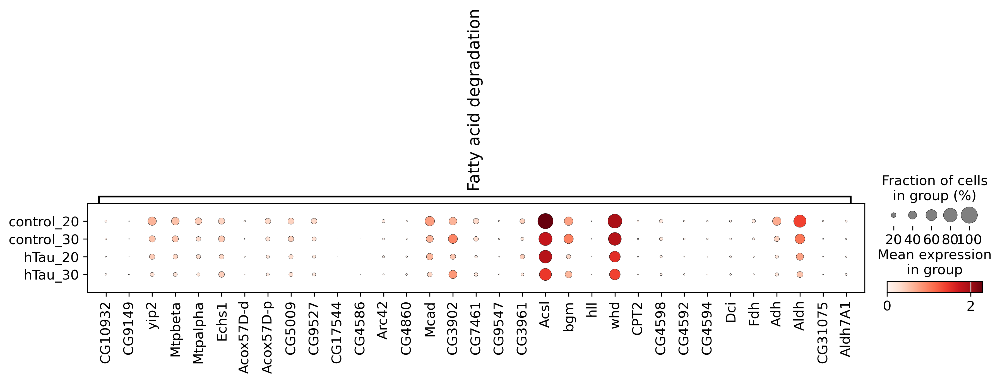

In [56]:
for kegg in fattyTerm_L:
    kegg_D = {kegg: fattyGenes_D[kegg]}
    sc.pl.dotplot(adata_body[ (adata_body.obs.adfca_annotation == 'adult fat body_body') & (adata_body.obs.genotype != 'AB42') & (adata_body.obs.age != '10') ], kegg_D, groupby='genoAge', 
                  save= f'_fatBody_KEGG_fattyAcid_genoAge_{kegg}_woAB42.pdf')

for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

In [57]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

## Grouped by genoAge

In [35]:
fattyTerm_L

['Fatty acid biosynthesis', 'Fatty acid elongation', 'Fatty acid degradation']

In [37]:
fattyDegGenes_D = {term: fattyGenes_D[term] for term in fattyGenes_D if term == 'Fatty acid degradation'}
fattyDegGenes_D.keys()

dict_keys(['Fatty acid degradation'])

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


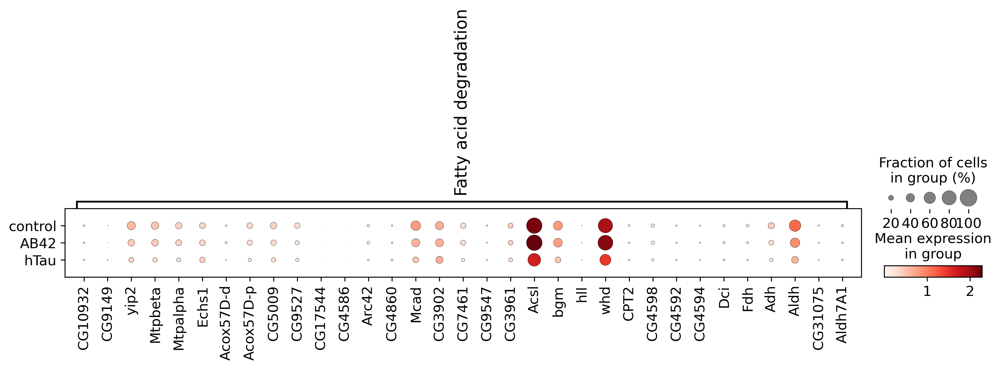

In [38]:
sc.pl.dotplot(adata_body[adata_body.obs.adfca_annotation == 'adult fat body_body'], fattyDegGenes_D, groupby='genotype', 
              save='_fatBody_KEGG_fattyAcidDegradation_genotype.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


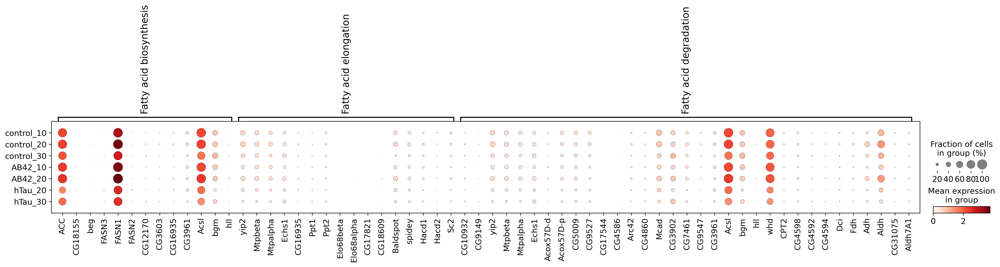

In [39]:
sc.pl.dotplot(adata_body[adata_body.obs.adfca_annotation == 'adult fat body_body'], fattyGenes_D, groupby='genoAge', 
              save='_fatBody_KEGG_fattyAcid_genoAge.pdf')

In [40]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

## scores of lipid-related genes

In [32]:
fattyGenes_D.keys()

dict_keys(['Fatty acid biosynthesis', 'Fatty acid elongation', 'Fatty acid degradation'])

In [36]:
adata_fat = adata_body[adata_body.obs.adfca_annotation == 'adult fat body_body']
adata_fat

View of AnnData object with n_obs × n_vars = 36353 × 16219
    obs: 'sample', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'genoAge', 'genoSex', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'adfca_annotation_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'
    obsp: 'connectivities', 'distances'

In [37]:
for term in fattyGenes_D.keys():
    print(term)
    shortTerm = term.split(' ')[-1]
    
    gene_L = fattyGenes_D[term]
    sc.tl.score_genes(adata_fat, gene_L, score_name=f'{term}_score')

Fatty acid biosynthesis
computing score 'Fatty acid biosynthesis_score'


/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


    finished: added
    'Fatty acid biosynthesis_score', score of gene set (adata.obs).
    450 total control genes are used. (0:00:01)
Fatty acid elongation
computing score 'Fatty acid elongation_score'
    finished: added
    'Fatty acid elongation_score', score of gene set (adata.obs).
    550 total control genes are used. (0:00:00)
Fatty acid degradation
computing score 'Fatty acid degradation_score'
    finished: added
    'Fatty acid degradation_score', score of gene set (adata.obs).
    546 total control genes are used. (0:00:00)


In [38]:
adata_fat

AnnData object with n_obs × n_vars = 36353 × 16219
    obs: 'sample', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'genoAge', 'genoSex', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'adfca_annotation_group', 'adfca_annotation_subcluster', 'Fatty acid biosynthesis_score', 'Fatty acid elongation_score', 'Fatty acid degradation_score'
    var: 'gene_ids', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'adfca_annotation_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'
    obsp: 'connectivities', 'distances'

In [39]:
adata_fat = adata_fat[ (adata_fat.obs.genotype != 'AB42') & (adata_fat.obs.age != '10') ]
adata_fat

View of AnnData object with n_obs × n_vars = 12903 × 16219
    obs: 'sample', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'genoAge', 'genoSex', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'adfca_annotation_group', 'adfca_annotation_subcluster', 'Fatty acid biosynthesis_score', 'Fatty acid elongation_score', 'Fatty acid degradation_score'
    var: 'gene_ids', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'adfca_annotation_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'
    obsp: 'connectivities', 'distances'

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

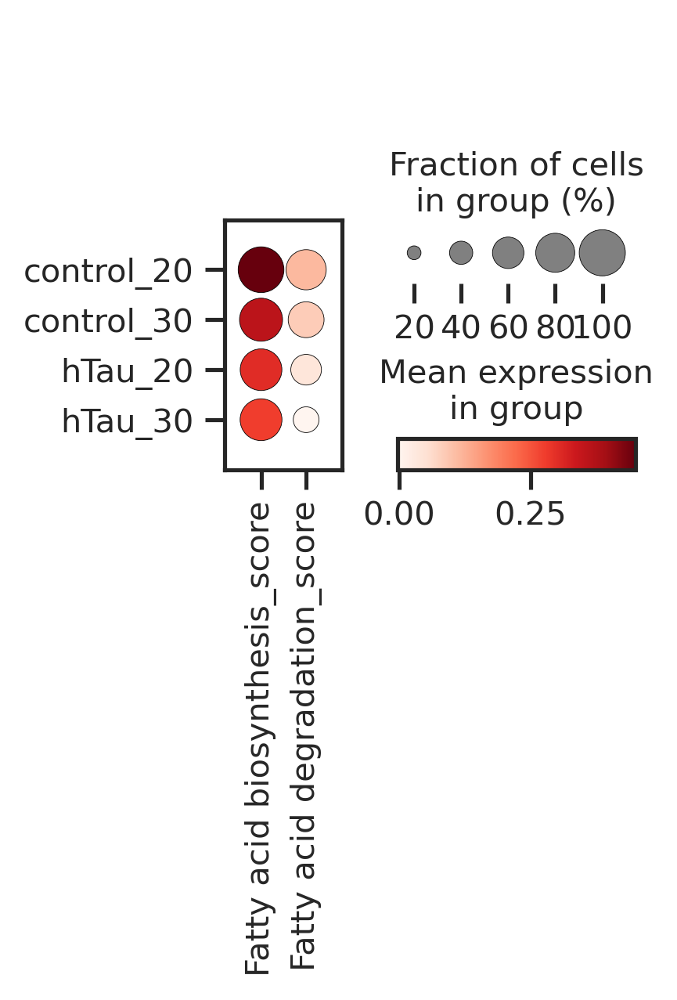

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

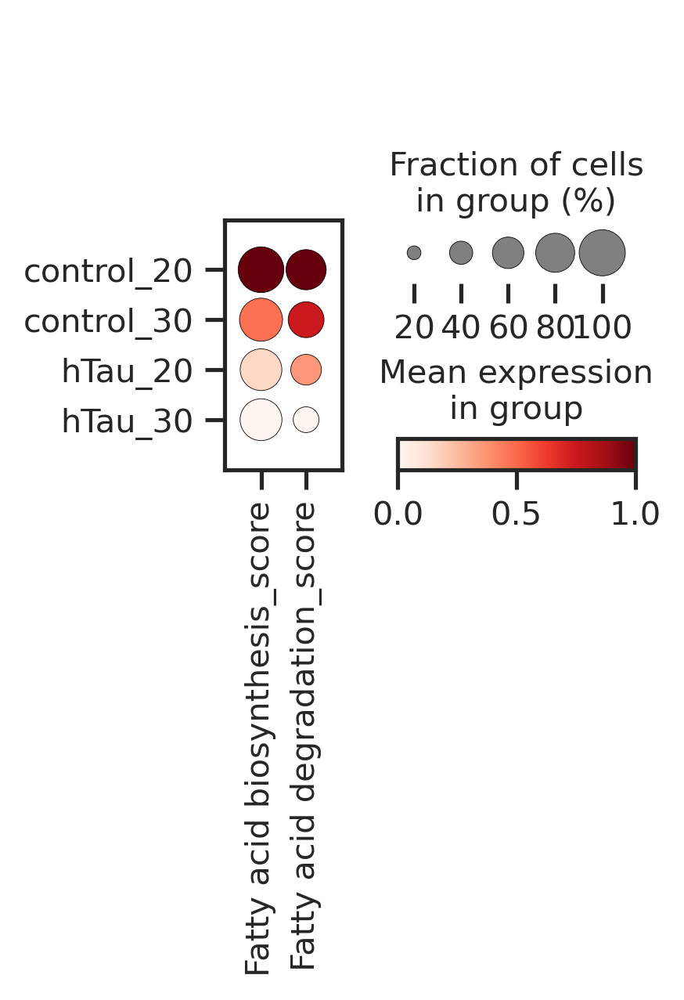

In [43]:
sc.pl.dotplot(adata_fat, ['Fatty acid biosynthesis_score', 'Fatty acid degradation_score'], groupby='genoAge', save=f'_adata_fat__fattyAcidScore.pdf')
sc.pl.dotplot(adata_fat, ['Fatty acid biosynthesis_score', 'Fatty acid degradation_score'], groupby='genoAge', standard_scale='var', save=f'_adata_fat__fattyAcidScore__scaled.pdf')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

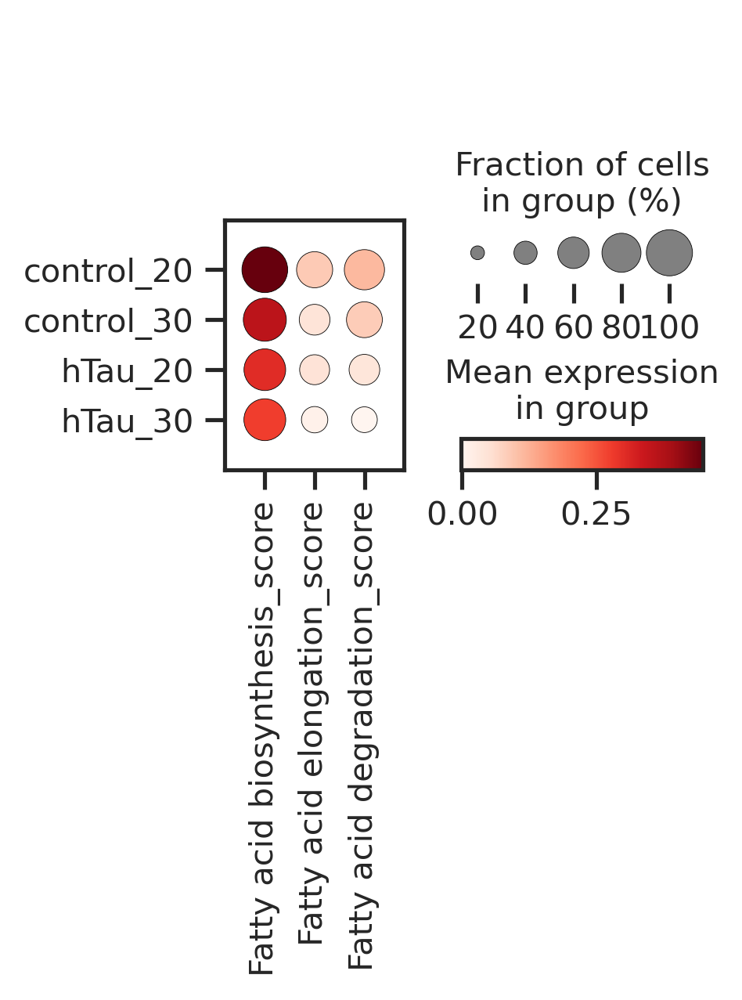

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

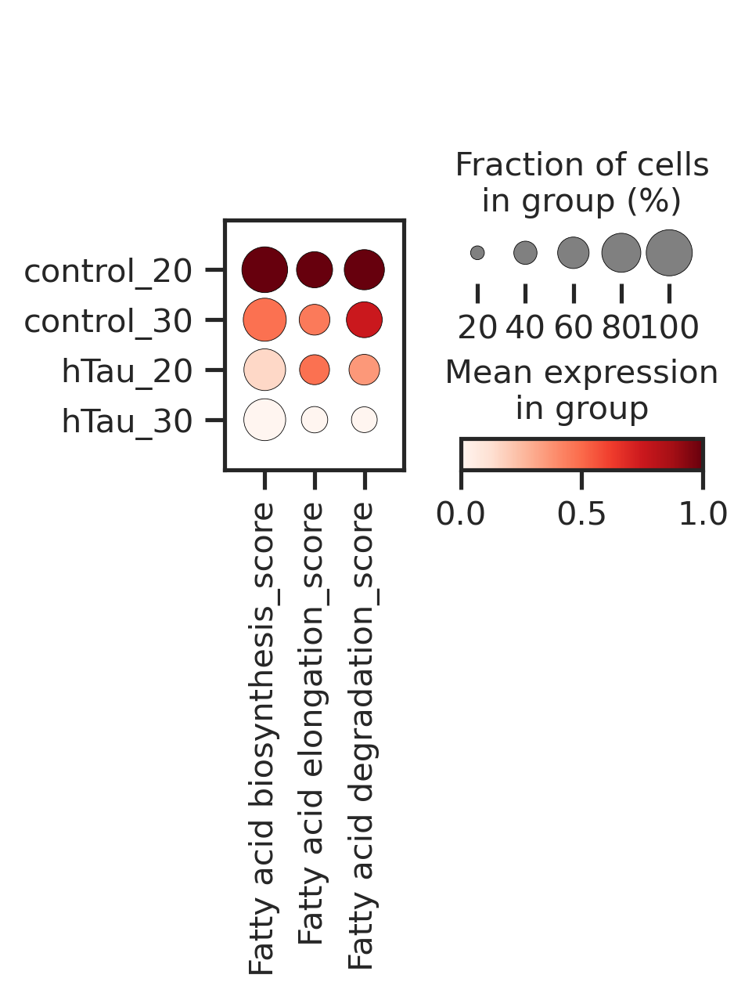

In [44]:
sc.pl.dotplot(adata_fat, ['Fatty acid biosynthesis_score', 'Fatty acid elongation_score', 'Fatty acid degradation_score'], groupby='genoAge', save=f'_adata_fat__fattyAcidScore__3terms.pdf')
sc.pl.dotplot(adata_fat, ['Fatty acid biosynthesis_score', 'Fatty acid elongation_score', 'Fatty acid degradation_score'], groupby='genoAge', standard_scale='var', save=f'_adata_fat__fattyAcidScore__3terms__scaled.pdf')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/data/tcl/miniconda3/envs/s

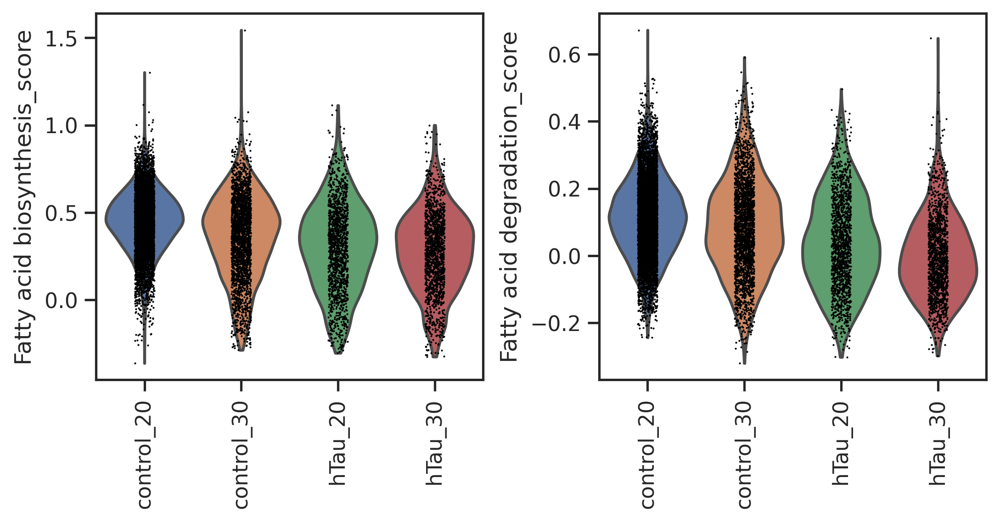

In [45]:
with rc_context({'figure.figsize': (4, 3.5)}): 
    sc.pl.violin(adata_fat, ['Fatty acid biosynthesis_score', 'Fatty acid degradation_score'], groupby='genoAge', rotation=90, save=f'_adata_fat__fattyAcidScore.pdf')

In [46]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

### wilcoxon rank sum test

In [52]:
from scipy.stats import ranksums
import pingouin as pg

In [70]:
adata_fat.obs.genoAge.cat.categories

Index(['control_20', 'control_30', 'hTau_20', 'hTau_30'], dtype='object')

In [71]:

for term in fattyGenes_D.keys():
    print(term)
    
    ctl20_L = adata_fat[adata_fat.obs.genoAge == 'control_20'].obs[f'{term}_score'].to_list()
    ctl30_L = adata_fat[adata_fat.obs.genoAge == 'control_30'].obs[f'{term}_score'].to_list()
    tau20_L = adata_fat[adata_fat.obs.genoAge == 'hTau_20'].obs[f'{term}_score'].to_list()
    tau30_L = adata_fat[adata_fat.obs.genoAge == 'hTau_30'].obs[f'{term}_score'].to_list()
    
    ## hTau_20 vs. control_20
    # Stat
    ranksumsTwosides_20=ranksums(tau20_L, ctl20_L)
    ranksumsGreater_20=ranksums(tau20_L, ctl20_L, alternative='greater')
    ranksumsLess_20=ranksums(tau20_L, ctl20_L, alternative='less')
    
    ## hTau_30 vs. control_30
    # Stat
    ranksumsTwosides_30=ranksums(tau30_L, ctl30_L)
    ranksumsGreater_30=ranksums(tau30_L, ctl30_L, alternative='greater')
    ranksumsLess_30=ranksums(tau30_L, ctl30_L, alternative='less')
    
    print('hTau_20 vs. control_20: ', ranksumsTwosides_20, ranksumsGreater_20, ranksumsLess_20)
    print('hTau_30 vs. control_30: ', ranksumsTwosides_30, ranksumsGreater_30, ranksumsLess_30)
    print()

Fatty acid biosynthesis
hTau_20 vs. control_20:  RanksumsResult(statistic=-21.690848584484336, pvalue=2.503268956416695e-104) RanksumsResult(statistic=-21.690848584484336, pvalue=1.0) RanksumsResult(statistic=-21.690848584484336, pvalue=1.2516344782083475e-104)
hTau_30 vs. control_30:  RanksumsResult(statistic=-11.155898695047783, pvalue=6.70122514484724e-29) RanksumsResult(statistic=-11.155898695047783, pvalue=1.0) RanksumsResult(statistic=-11.155898695047783, pvalue=3.35061257242362e-29)

Fatty acid elongation
hTau_20 vs. control_20:  RanksumsResult(statistic=-11.33882232859008, pvalue=8.427084831039323e-30) RanksumsResult(statistic=-11.33882232859008, pvalue=1.0) RanksumsResult(statistic=-11.33882232859008, pvalue=4.213542415519662e-30)
hTau_30 vs. control_30:  RanksumsResult(statistic=-8.137180243798818, pvalue=4.0459016354636227e-16) RanksumsResult(statistic=-8.137180243798818, pvalue=0.9999999999999998) RanksumsResult(statistic=-8.137180243798818, pvalue=2.0229508177318113e-16)



# Fig5 Sup: GO analysis

## Load files

In [84]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [127]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Load GO files

### Load ontologies and associations

In [128]:
import goatools

In [129]:
goatools.__version__

'1.3.1'

In [130]:
!pwd

/data/tcl/Project/ADFCA


In [131]:
from goatools.obo_parser import GODag
from goatools.anno.gaf_reader import GafReader

obodag = GODag("../../Resource/GO/go-basic.obo")
ogaf = GafReader("../../Resource/GO/FlyBase_gene_association_09082022.gaf") # FlyBase file

../../Resource/GO/go-basic.obo: fmt(1.2) rel(2022-07-01) 47,008 Terms
HMS:0:00:02.279826 121,359 annotations READ: ../../Resource/GO/FlyBase_gene_association_09082022.gaf 


In [132]:
ns2assc = ogaf.get_ns2assc()

### Load Background gene set

In [133]:
geneid2symbol_Df=pd.read_table('cellrangerSummary/features.tsv', header=None, index_col=0)
geneid2symbol_Df.head()

,1,2
0,,
FBgn0267594,CR45932,Gene Expression
FBgn0259849,Su(Ste):CR42418,Gene Expression
FBgn0085494,Mst77Y-16Psi,Gene Expression
FBgn0085506,CG40635,Gene Expression
FBgn0259870,Su(Ste):CR42439,Gene Expression


In [134]:
geneid2symbol_D= dict(zip(geneid2symbol_Df.index.to_list(), geneid2symbol_Df[1].to_list()))

In [135]:
symbol2geneid_D= dict(zip(geneid2symbol_Df[1].to_list(), geneid2symbol_Df.index.to_list()))

### Initialize a GOEA object 

In [93]:
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

goeaobj = GOEnrichmentStudyNS(
        geneid2symbol_D, # List of fly protein-coding genes
        ns2assc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method


Load BP Ontology Enrichment Analysis ...
 59% 10,305 of 17,562 population items found in association

Load CC Ontology Enrichment Analysis ...
 57%  9,955 of 17,562 population items found in association

Load MF Ontology Enrichment Analysis ...
 53%  9,302 of 17,562 population items found in association


## Load gene list

In [98]:
celltypeN700_L = pd.read_csv(f'{cellnFolder}/celltype_cellN_n700.csv').annotation.to_list()
degLong_Df=pd.read_csv(f'{figure3Folder}/degSummary/degLong_Df_genotype_compareToControl_cellN700.csv', index_col=0)
# degN_nonNeuron_mtx=pd.read_csv(f'{degSummaryFolder}/degN_nonNeuron_mtx_compareToControll_cellN700.csv', index_col=0)
# dotplotNonNeuron_Df=pd.read_csv(f'{compositionFolder}/dotplotNonNeuron_Df_normalizeToControl.csv', index_col=0)
# dfAllNonNeuron = pd.read_csv(f'{compositionFolder}/dfAllNonNeuron_normalizeToControl.csv', index_col=0)

In [141]:
celltypeN700_L_body = adata_body.obs.adfca_annotation.cat.categories.to_list()
len(celltypeN700_L_body)

76

## Plot non-redundant GOs

In [84]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [113]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 3285
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad'
    var: 'gene_ids-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mean-0', 'std-0', 'gene_ids-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'mean-1', 'std-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'

### import revioGO data

In [116]:
from matplotlib.colors import LogNorm, Normalize

In [145]:
allGoConcat_Df=pd.read_csv(f'{figure3Folder}/GO_compareToControl/allGoConcat_Df_compareToControl.csv')
upGoConcat_Df=pd.read_csv(f'{figure3Folder}/GO_compareToControl/upGoConcat_Df_compareToControl.csv')
downGoConcat_Df=pd.read_csv(f'{figure3Folder}/GO_compareToControl/downGoConcat_Df_compareToControl.csv')

In [147]:
revigo_Df = pd.read_table(f'{figure3Folder}/revigo_compareToControl/Revigo_BP_Table_ADFCA.tsv')
revigo_Df[:20]

,TermID,Name,Value,LogSize,Frequency,Uniqueness,Dispensability,Representative
0,GO:0000022,mitotic spindle elongation,-2.441666,1.146128,0.113300,0.908234,0.528503,NaN
1,GO:0051225,spindle assembly,-1.669960,1.806180,0.549067,0.885278,0.744439,22.0
2,GO:0000055,ribosomal large subunit export from nucleus,-1.359202,0.845098,0.052292,0.882807,0.688166,NaN
3,GO:0000165,MAPK cascade,-1.778889,1.544068,0.296322,0.851776,0.535502,NaN
4,GO:0000226,microtubule cytoskeleton organization,-2.055109,2.544068,3.041659,0.893243,0.647770,NaN
5,GO:0007051,spindle organization,-1.498134,2.103804,1.098135,0.892956,0.762188,226.0
6,GO:0000278,mitotic cell cycle,-2.622228,2.594393,3.416420,0.958225,0.035096,NaN
7,GO:0007059,chromosome segregation,-1.306328,2.274158,1.629772,0.959916,0.716547,278.0
8,GO:0000380,"alternative mRNA splicing, via spliceosome",-1.472329,0.698970,0.034861,0.947086,0.346603,NaN
9,GO:0000381,"regulation of alternative mRNA splicing, via s...",-4.946922,1.944483,0.758236,0.886103,0.325096,NaN


In [148]:
nonRedundantGo_Df=revigo_Df[revigo_Df.Representative.isna()]
nonRedundantGo_Df

,TermID,Name,Value,LogSize,Frequency,Uniqueness,Dispensability,Representative
0,GO:0000022,mitotic spindle elongation,-2.441666,1.146128,0.113300,0.908234,0.528503,NaN
2,GO:0000055,ribosomal large subunit export from nucleus,-1.359202,0.845098,0.052292,0.882807,0.688166,NaN
3,GO:0000165,MAPK cascade,-1.778889,1.544068,0.296322,0.851776,0.535502,NaN
4,GO:0000226,microtubule cytoskeleton organization,-2.055109,2.544068,3.041659,0.893243,0.647770,NaN
6,GO:0000278,mitotic cell cycle,-2.622228,2.594393,3.416420,0.958225,0.035096,NaN
...,...,...,...,...,...,...,...,...
1157,GO:2000648,positive regulation of stem cell proliferation,-1.416600,0.954243,0.069723,0.902045,0.651139,NaN
1158,GO:2000683,regulation of cellular response to X-ray,-1.585713,0.698970,0.034861,0.911177,0.310999,NaN
1159,GO:2000738,positive regulation of stem cell differentiation,-2.576015,0.778151,0.043577,0.883649,0.522921,NaN
1161,GO:2000779,regulation of double-strand break repair,-1.402818,1.041393,0.087154,0.882887,0.332103,NaN


In [149]:
revigoNonRedundantGo_L=nonRedundantGo_Df.TermID.to_list()
len(revigoNonRedundantGo_L)

517

In [154]:
goConcatRevigo_Df_exp.annotation.value_counts() 

28

In [153]:
plt.ioff()

color_D = {'up':'Reds', 'down': 'Blues', 'all': 'Purples'}
for degDirection in ['up', 'down', 'all']:
    print(f'degDirection: {degDirection}')
    goConcat_Df = pd.read_csv(f'{figure3Folder}/GO_compareToControl/{degDirection}GoConcat_Df_compareToControl.csv')

    ### GO from revigo ==> don't use in the neuron dataset
    goConcatRevigo_Df=goConcat_Df[goConcat_Df['# GO'].isin(revigoNonRedundantGo_L)]
    goConcatRevigo_Df=goConcat_Df[goConcat_Df.NS == 'BP']
    
    
    # GO from specific genotypes
    # for n, expCompare in enumerate(expCompare_Df.compare2[:]):
    for n, expCompare in enumerate(genoCompare_Df.expSet[:]):
        # expCompare1 = expCompare_Df.compare1[n]
        print(expCompare)
        goConcatRevigo_Df_exp = goConcatRevigo_Df[goConcatRevigo_Df.expCompare == expCompare]
        
        # matrix of GO fdr
        goMtx_exp = pd.DataFrame(columns=celltypeN700_L_body, index=goConcatRevigo_Df_exp.name.value_counts().index.to_list())
        for i, cellType in enumerate(celltypeN700_L_body):
            # print(cellType)
            
            ### run through each GO term
            for j, goName in enumerate(goMtx_exp.index):
                df=goConcatRevigo_Df_exp[(goConcatRevigo_Df_exp.name == goName) & (goConcatRevigo_Df_exp.annotation == cellType)]
                if len(df) != 0:
                    fdr= df.iloc[0,6]
                    goMtx_exp.iloc[j, i]=fdr
                else:
                    goMtx_exp.iloc[j, i]=0
        goMtxTopEach_exp=goMtx_exp[:]
    
    
        ###
        ### top 5 GOs from each cell type
        goN=5
        topGO_eachCelltype_L=[]
        topGO_eachCelltype_D={}
        
        # remove GOs not found in all cell types
        goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)
        # print(goMtxTopEach_exp.shape)
        goMtxTopEach_exp= goMtxTopEach_exp.loc[goMtxTopEach_exp['sumGoCounts'] != 0, :]
        goMtxTopEach_exp.drop('sumGoCounts', axis=1, inplace=True)
        # print(goMtxTopEach_exp.shape)
        
        # select top5 GO from each celltype
        for cellType in goMtxTopEach_exp.columns:
            # print(cellType)    
            
            ### top n GO
            cellType_mtx=pd.DataFrame(goMtxTopEach_exp.loc[:,cellType])
            cellType_mtx.sort_values(by=cellType, ascending=False, inplace=True)
            cellTypeTopGo_L=cellType_mtx.index.to_list()[:goN]
            # print(cellType, cellTypeTopGo_L)
            
            # print(cellTypeTopGo_L)
            if len(cellTypeTopGo_L) != 0:
                for i, go in enumerate(cellTypeTopGo_L):
                    if goMtxTopEach_exp.loc[go, cellType] != 0:
                        topGO_eachCelltype_L.append(go)
                        # print(cellType, go)
                        
                    #     if cellType in topGO_eachCelltype_D.keys(): topGO_eachCelltype_D[cellType].append(go)
                    #     if cellType not in topGO_eachCelltype_D.keys():
                    #         topGO_eachCelltype_D[cellType] = [go]
                    #     if go not in topGO_eachCelltype_L: 
                    #         topGO_eachCelltype_L.append(go)                    
        goMtxTopEach_exp=goMtxTopEach_exp.loc[goMtxTopEach_exp.index.isin(topGO_eachCelltype_L)]
        goMtxTopEach_exp=goMtxTopEach_exp.loc[:, goMtxTopEach_exp.sum(axis=0) != 0]
        goMtxTopEach_exp
        
        # Plot topN GOs
        kws = dict(cbar_kws=dict(orientation='horizontal'))
        ax=sns.clustermap(goMtxTopEach_exp.astype(float),  figsize=(13, 12), xticklabels=True, cmap=color_D[degDirection], dendrogram_ratio=(0.05, 0.1),  **kws, vmax=10, linewidths=0, yticklabels=True)
        ax.ax_cbar.set_position((0.80, .15, .05, .02))
        # ax.cax.set_visible(False)
        plt.savefig(f'{goFolder}/heatmap_GO_{degDirection}_top{goN}Each_{expCompare}.pdf')
        plt.close()
        
        
        # ### Selected cell types
        # goMtxTopEach_exp_select = goMtxTopEach_exp.loc[:,(goMtxTopEach_exp.columns.isin(cellType_L)) ]
        # if sum((goMtxTopEach_exp_select.index.isin(goSelect_L)) | (['endoplasmic reticulum' in index for index in goMtxTopEach_exp_select.index])) > 1:
        #     goMtxTopEach_exp_select = goMtxTopEach_exp_select.loc[ (goMtxTopEach_exp_select.index.isin(goSelect_L)) | (['endoplasmic reticulum' in index for index in goMtxTopEach_exp_select.index]) ]
        #     kws = dict(cbar_kws=dict(orientation='horizontal'))
        #     ax=sns.clustermap(goMtxTopEach_exp_select.astype(float),  figsize=(8.5, 7.5), xticklabels=True, cmap=color_D[degDirection], dendrogram_ratio=(0.05, 0.1),  **kws, vmax=5, linewidths=0, yticklabels=True)
        #     ax.ax_cbar.set_position((0.80, .15, .05, .02))
        #     # ax.cax.set_visible(False)
        #     plt.savefig(f'{goFolder}/heatmap_GO_{degDirection}_top{goN}Each_{expCompare}_selected.pdf')
        #     plt.close()
        
    
    
    print()
plt.ion()

degDirection: up
AB42


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


hTau


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)



degDirection: down
AB42


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


hTau


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)



degDirection: all
AB42


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


hTau


/tmp/ipykernel_2227255/515954802.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goMtxTopEach_exp.loc[:,'sumGoCounts'] = goMtxTopEach_exp.sum(axis=1)


In [154]:
goConcat_Df = pd.read_csv(f'{figure3Folder}/GO_compareToControl/allGoConcat_Df_compareToControl.csv')
goConcat_Df

,# GO,NS,p_fdr_bh,name,annotation,expCompare,MinusLogFdr,goName
0,GO:0002181,BP,7.169472e-106,cytoplasmic translation,16-cell germline cyst in germarium region 2a a...,hTau,105.144513,GO:0002181_cytoplasmic translation
1,GO:0006412,BP,6.067564e-28,translation,16-cell germline cyst in germarium region 2a a...,hTau,27.216986,GO:0006412_translation
2,GO:0000028,BP,4.505353e-05,ribosomal small subunit assembly,16-cell germline cyst in germarium region 2a a...,hTau,4.346271,GO:0000028_ribosomal small subunit assembly
3,GO:0000027,BP,1.534293e-02,ribosomal large subunit assembly,16-cell germline cyst in germarium region 2a a...,hTau,1.814092,GO:0000027_ribosomal large subunit assembly
4,GO:0006414,BP,1.702719e-02,translational elongation,16-cell germline cyst in germarium region 2a a...,hTau,1.768857,GO:0006414_translational elongation
...,...,...,...,...,...,...,...,...
9346,GO:0030594,MF,1.257236e-03,neurotransmitter receptor activity,transmedullary neuron Tm9,AB42,2.900583,GO:0030594_neurotransmitter receptor activity
9347,GO:0022848,MF,1.257236e-03,acetylcholine-gated cation-selective channel a...,transmedullary neuron Tm9,AB42,2.900583,GO:0022848_acetylcholine-gated cation-selectiv...
9348,GO:0005231,MF,1.213845e-02,excitatory extracellular ligand-gated ion chan...,transmedullary neuron Tm9,AB42,1.915837,GO:0005231_excitatory extracellular ligand-gat...
9349,GO:0050839,MF,1.827185e-02,cell adhesion molecule binding,transmedullary neuron Tm9,AB42,1.738217,GO:0050839_cell adhesion molecule binding


In [155]:
adata_headBody.obs.adfca_annotation_broad.value_counts()

CNS neuron                    190758
sensory neuron                 67944
muscle cell                    59410
epithelial cell                49471
female reproductive system     48760
fat cell                       47060
unannotated                    36990
glial cell                     35563
gut cell                       20550
oenocyte                       15605
tracheal cell                  14460
gland                          10162
female germline cell           10151
hemocyte                        9575
male reproductive system        4060
PNS neuron                      2449
excretory system                 918
male germline cell               547
cardial cell                      25
Name: adfca_annotation_broad, dtype: int64

In [161]:
neuronCellType_L = adata_headBody[adata_headBody.obs.adfca_annotation_broad.isin(['CNS neuron', 'sensory neuron', 'PNS neuron'])].obs.adfca_annotation.value_counts().index.to_list()
neuronCellType_L[:10]

['uncharacterized CNS neuron',
 'outer photoreceptor cell',
 'cone cell',
 'adult ventral nervous system',
 'T neuron T4/T5',
 'olfactory receptor neuron',
 'ABeta42-specific cluster',
 'gamma Kenyon cell',
 'alpha/beta Kenyon cell',
 'columnar neuron T1']

In [162]:
goConcat_Df_tau = goConcat_Df[ (goConcat_Df.expCompare == 'hTau') & (goConcat_Df.annotation.isin(neuronCellType_L))]
goConcat_Df_tau

,# GO,NS,p_fdr_bh,name,annotation,expCompare,MinusLogFdr,goName
102,GO:0007268,BP,0.047785,chemical synaptic transmission,T neuron T4/T5,hTau,1.320708,GO:0007268_chemical synaptic transmission
2158,GO:0006302,BP,0.006563,double-strand break repair,adult peripheral nervous system,hTau,2.182867,GO:0006302_double-strand break repair
2159,GO:0007268,BP,0.006563,chemical synaptic transmission,adult peripheral nervous system,hTau,2.182867,GO:0007268_chemical synaptic transmission
2160,GO:1901215,BP,0.007277,negative regulation of neuron death,adult peripheral nervous system,hTau,2.138026,GO:1901215_negative regulation of neuron death
2161,GO:0001508,BP,0.020589,action potential,adult peripheral nervous system,hTau,1.686371,GO:0001508_action potential
...,...,...,...,...,...,...,...,...
9060,GO:0005515,MF,0.005340,protein binding,photoreceptor cell R8,hTau,2.272419,GO:0005515_protein binding
9061,GO:0002046,MF,0.023035,opsin binding,photoreceptor cell R8,hTau,1.637617,GO:0002046_opsin binding
9062,GO:0010461,MF,0.023035,light-activated ion channel activity,photoreceptor cell R8,hTau,1.637617,GO:0010461_light-activated ion channel activity
9304,GO:0007165,BP,0.003350,signal transduction,transmedullary neuron Tm1,hTau,2.475018,GO:0007165_signal transduction


In [170]:
goConcat_Df_tau.goName.value_counts().head(30)

GO:0005886_plasma membrane                                                    13
GO:0007268_chemical synaptic transmission                                      9
GO:0048786_presynaptic active zone                                             9
GO:0045202_synapse                                                             8
GO:0005887_integral component of plasma membrane                               8
GO:0045211_postsynaptic membrane                                               7
GO:0005737_cytoplasm                                                           6
GO:0043005_neuron projection                                                   6
GO:0031594_neuromuscular junction                                              6
GO:0016079_synaptic vesicle exocytosis                                         6
GO:0098609_cell-cell adhesion                                                  5
GO:0030424_axon                                                                5
GO:0005634_nucleus          

In [168]:
goConcat_Df_tau.sort_values(by='MinusLogFdr', ascending=False)[:20]

,# GO,NS,p_fdr_bh,name,annotation,expCompare,MinusLogFdr,goName
8594,GO:0005886,CC,5.738806e-25,plasma membrane,outer photoreceptor cell,hTau,24.241178,GO:0005886_plasma membrane
8595,GO:0005737,CC,3.275780e-20,cytoplasm,outer photoreceptor cell,hTau,19.484685,GO:0005737_cytoplasm
8596,GO:0005634,CC,1.383285e-16,nucleus,outer photoreceptor cell,hTau,15.859088,GO:0005634_nucleus
8597,GO:0016028,CC,3.166539e-16,rhabdomere,outer photoreceptor cell,hTau,15.499415,GO:0016028_rhabdomere
8661,GO:0005515,MF,4.071310e-16,protein binding,outer photoreceptor cell,hTau,15.390266,GO:0005515_protein binding
8598,GO:0031594,CC,9.449653e-16,neuromuscular junction,outer photoreceptor cell,hTau,15.024584,GO:0031594_neuromuscular junction
2721,GO:0005886,CC,7.303742e-15,plasma membrane,adult ventral nervous system,hTau,14.136455,GO:0005886_plasma membrane
3427,GO:0005737,CC,9.467702e-15,cytoplasm,cone cell,hTau,14.023755,GO:0005737_cytoplasm
3428,GO:0005886,CC,1.521841e-12,plasma membrane,cone cell,hTau,11.817631,GO:0005886_plasma membrane
8662,GO:0004674,MF,2.824476e-12,protein serine/threonine kinase activity,outer photoreceptor cell,hTau,11.549062,GO:0004674_protein serine/threonine kinase act...


## Expression of nSyb in EE

In [72]:
neuronCellType_L = adata_headBody[adata_headBody.obs.adfca_annotation_broad.isin(['CNS neuron', 'sensory neuron', 'PNS neuron'])].obs.adfca_annotation.value_counts().index.to_list()
neuronCellType_L.remove('cone cell')
neuronCellType_L[:10]

['uncharacterized CNS neuron',
 'outer photoreceptor cell',
 'adult ventral nervous system',
 'T neuron T4/T5',
 'olfactory receptor neuron',
 'ABeta42-specific cluster',
 'gamma Kenyon cell',
 'alpha/beta Kenyon cell',
 'columnar neuron T1',
 'photoreceptor cell R8']

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.ob

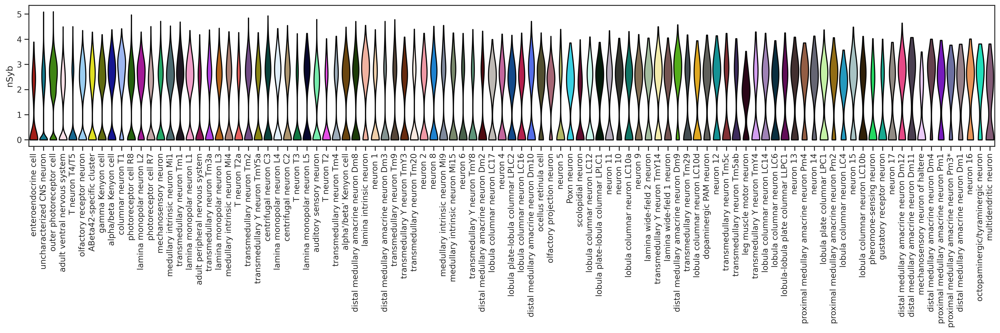

In [87]:
with rc_context({'figure.figsize': (18, 3.5)}):
    sc.pl.violin(adata_headBody[ (adata_headBody.obs.adfca_annotation.isin(neuronCellType_L + ['enteroendocrine cell']))  ], 
                 keys=['nSyb'], groupby='adfca_annotation', size = 0, rotation=90, 
                 order= ['enteroendocrine cell'] + neuronCellType_L, 
                 save=f'_nSyb__eeCell_neuron.pdf')

In [88]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure5PicFolder}/{x}')

# Cell type specificity of DEG

## Load files

In [22]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v1.0/adata_adfca_head_v1.0.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v1.0/adata_adfca_body_v1.0.h5ad')

/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/data/tcl/miniconda3/envs/scvi/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [23]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

<ipython-input-23-d569f6e12017>:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_headBody = adata_head.concatenate(adata_body, join='outer')


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'sample', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'genoAge', 'genoSex', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'adfca_annotation_group', 'adfca_annotation_subcluster', 'batch'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Load DEG file

In [24]:
degAllE05Gene_Df = pd.read_csv(f'{figure3Folder}/degSummary/degLong_Df_genotype_compareToControl_cellN700.csv', index_col=0)

In [25]:
degAllE05Gene_Df

,names,pvals,pvals_adj,logfoldchanges,annotation,group
0,Pde9,8.831894e-52,1.432445e-47,-1.246592,16-cell germline cyst in germarium region 2a a...,AB42
1,mt:lrRNA,2.705211e-32,2.193791e-28,3.499738,16-cell germline cyst in germarium region 2a a...,AB42
2,pre-rRNA:CR45845,6.289391e-26,3.400254e-22,0.674733,16-cell germline cyst in germarium region 2a a...,AB42
3,pAbp,4.220895e-26,6.845869e-22,-1.621699,16-cell germline cyst in germarium region 2a a...,hTau
4,Dscam4,6.435551e-25,2.609455e-21,6.977312,16-cell germline cyst in germarium region 2a a...,AB42
...,...,...,...,...,...,...
43616,mAChR-A,6.574077e-05,3.046427e-02,1.330468,transmedullary neuron Tm9,AB42
43617,CG32982,7.315896e-05,3.296014e-02,-0.725272,transmedullary neuron Tm9,AB42
43618,CadN2,1.217911e-05,3.950660e-02,1.349271,transmedullary neuron Tm9,hTau
43619,Fife,1.009878e-04,4.426814e-02,-1.287957,transmedullary neuron Tm9,AB42


In [26]:
degAllE05Gene_Df[(degAllE05Gene_Df.pvals_adj <= 0.05) & (degAllE05Gene_Df.group.isin(['AB42']))].to_csv(f'{figure3Folder}/degSummary/degAllE05Gene_Df_AB42.csv', index=False)
degAllE05Gene_Df[(degAllE05Gene_Df.pvals_adj <= 0.05) & (degAllE05Gene_Df.group.isin(['hTau']))].to_csv(f'{figure3Folder}/degSummary/degAllE05Gene_Df_hTau.csv', index=False)

In [27]:
degAB42_Df = pd.read_csv(f'{figure3Folder}/degSummary/degAllE05Gene_Df_AB42.csv')
degTau_Df = pd.read_csv(f'{figure3Folder}/degSummary/degAllE05Gene_Df_hTau.csv')
# degAB42_Df

In [28]:
# neuronCellType_L
broadNeuron_L = [broadtype for broadtype in pd.Categorical(adata_headBody.obs.adfca_annotation_broad).categories if 'neuron' in broadtype] # 

annotation_Df = pd.read_csv(f'/data/tcl/Project/ADFCA/adataProcess/v1.0/adfca_annotation_detailed_and_broad_detailed_subcluster.csv')
neuronCellType_L = annotation_Df[annotation_Df.adfca_annotation_broad.isin(broadNeuron_L)].adfca_annotation.to_list()
nonNeuronCellType_L = annotation_Df[~annotation_Df.adfca_annotation_broad.isin(broadNeuron_L)].adfca_annotation.to_list()

annotation_Df

,adfca_annotation_broad,adfca_annotation_group,adfca_annotation,adfca_annotation_subcluster,cellN
0,CNS neuron,LDH-high cluster,LDH-high cluster,LDH-high cluster,3765
1,CNS neuron,CNS neuron ungrouped,neuron 1,neuron 1,1118
2,CNS neuron,CNS neuron ungrouped,neuron 10,neuron 10,589
3,CNS neuron,CNS neuron ungrouped,neuron 11,neuron 11,624
4,CNS neuron,CNS neuron ungrouped,neuron 12,neuron 12,417
...,...,...,...,...,...
215,sensory neuron,sensory neuron,scolopidial neuron,scolopidial neuron,659
216,tracheal cell,tracheal cell,adult tracheal cell_body,adult tracheal cell_body,7900
217,tracheal cell,tracheal cell,adult tracheal cell_head,adult tracheal cell_head,6560
218,unannotated,unannotated,antimicrobial peptide-producing cell,antimicrobial peptide-producing cell,507


In [29]:
degAllE05Gene_Df_noAbeta = degAllE05Gene_Df[~degAllE05Gene_Df.names.isin(['ABeta42', 'hTau0N4Rfull'])]
degNeuron_Df_noAbeta = degAllE05Gene_Df_noAbeta[degAllE05Gene_Df_noAbeta.annotation.isin(neuronCellType_L)]
degNonNeuron_Df_noAbeta = degAllE05Gene_Df_noAbeta[degAllE05Gene_Df_noAbeta.annotation.isin(nonNeuronCellType_L)]
degNeuron_Df_noAbeta

,names,pvals,pvals_adj,logfoldchanges,annotation,group
579,Hsc70-3,1.354399e-29,1.098350e-25,5.624822,T neuron T2,AB42
580,hzg,1.151322e-26,6.224433e-23,3.770936,T neuron T2,AB42
582,dpr21,1.461159e-19,5.924633e-16,-1.724748,T neuron T2,AB42
583,jim,1.626104e-18,1.318689e-14,-1.394060,T neuron T2,hTau
584,lncRNA:noe,7.374249e-18,2.392059e-14,1.099843,T neuron T2,AB42
...,...,...,...,...,...,...
43616,mAChR-A,6.574077e-05,3.046427e-02,1.330468,transmedullary neuron Tm9,AB42
43617,CG32982,7.315896e-05,3.296014e-02,-0.725272,transmedullary neuron Tm9,AB42
43618,CadN2,1.217911e-05,3.950660e-02,1.349271,transmedullary neuron Tm9,hTau
43619,Fife,1.009878e-04,4.426814e-02,-1.287957,transmedullary neuron Tm9,AB42


## Non-neuronal Cells

In [30]:
degNnoneuron_L = degNonNeuron_Df_noAbeta.names.value_counts().index.to_list()
degN_nonneuron_Df = pd.DataFrame(columns=['gene', 'AB42', 'hTau'])

n=0
for n, gene in enumerate(degNnoneuron_L[:]):
    gene_Df = degNonNeuron_Df_noAbeta[degNonNeuron_Df_noAbeta.names == gene]
    
    abetaDegN = gene_Df.group.isin(['AB42']).sum()
    tauDegN = gene_Df.group.isin(['hTau']).sum()
    # print(gene, abetaDegN_10, tauDegN_20, abetaDegN_20, tauDegN_30)
    
    degN_nonneuron_Df.loc[len(degN_nonneuron_Df)] = [gene, abetaDegN, tauDegN]

degN_nonneuron_Df

,gene,AB42,hTau
0,lncRNA:Hsromega,38,37
1,lncRNA:flam,23,37
2,pre-rRNA:CR45845,42,18
3,lncRNA:CR45054,30,26
4,Pdp1,29,26
...,...,...,...
5995,CG12177,1,0
5996,CG13516,1,0
5997,CCT1,1,0
5998,CG5589,1,0


In [31]:
degN_nonneuron_Df[degN_nonneuron_Df.gene == 'Parp']

,gene,AB42,hTau
13,Parp,17,32


In [32]:
from adjustText import adjust_text

In [48]:
ctCutoff=5

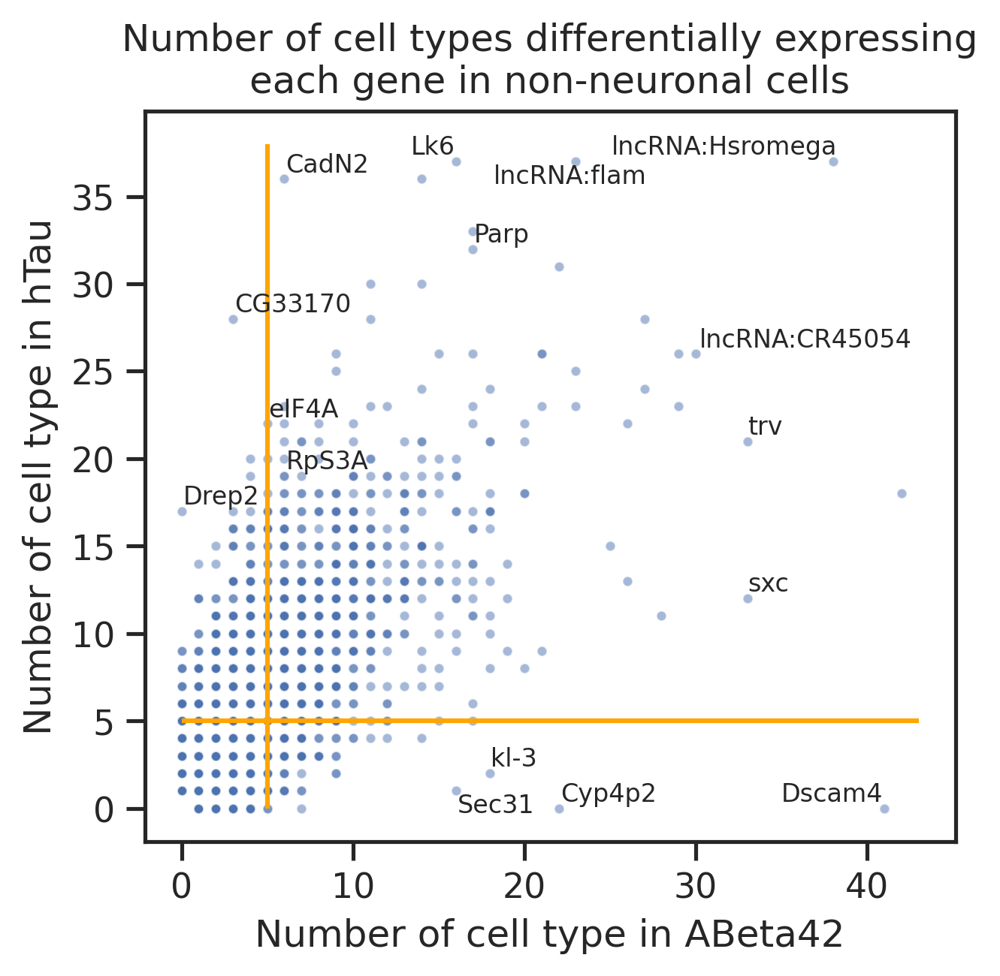

In [49]:
fig, ax = plt.subplots(figsize=(4.5, 4.5))
sns.scatterplot(x='AB42', y='hTau', data=degN_nonneuron_Df, alpha=0.5, ax=ax)
ax.collections[0].set_sizes([10])    
plt.xlabel('Number of cell type in ABeta42')
plt.ylabel('Number of cell type in hTau')
plt.title('Number of cell types differentially expressing\neach gene in non-neuronal cells')

highlight_L=[ 'CadN2', 'eIF4A', 'Lk6', 'CG33170', 'RpS3A', 'Drep2', #tau
             'Dscam4', 'Cyp4p2', 'kl-3', 'Sec31', #ab42
             'lncRNA:Hsromega', 'lncRNA:flam', 'lncRNA:CR45054', 'trv', 'sxc', 'Parp',  # common changes
            ]
texts = [plt.text(x=degN_nonneuron_Df['AB42'][n], y=degN_nonneuron_Df['hTau'][n], s=degN_nonneuron_Df.gene[n], fontsize=8) 
         for n, gene in enumerate(degN_nonneuron_Df.gene) if gene in highlight_L]
adjust_text(texts, ) 

plt.vlines(x=ctCutoff, ymin=0, ymax=degN_nonneuron_Df['hTau'].max()+1, color='orange')
plt.hlines(y=ctCutoff, xmin=0, xmax=degN_nonneuron_Df['AB42'].max()+1, color='orange')

plt.tight_layout()
plt.savefig(f'{figure5PicFolder}/degN_eachGene_nonneuron.pdf', bbox_inches='tight')
plt.show()

In [50]:
degN_nonneuron_Df['sum'] = degN_nonneuron_Df.AB42 + degN_nonneuron_Df.hTau
degN_nonneuron_Df.sort_values(by='sum', ascending=False, inplace=True)
degN_nonneuron_Df.reset_index(drop=True, inplace=True)
degN_nonneuron_Df

,gene,AB42,hTau,sum
0,lncRNA:Hsromega,38,37,75
1,lncRNA:flam,23,37,60
2,pre-rRNA:CR45845,42,18,60
3,lncRNA:CR45054,30,26,56
4,Pdp1,29,26,55
...,...,...,...,...
5995,CCT1,1,0,1
5996,CG5589,1,0,1
5997,mex1,0,1,1
5998,Ranbp9,1,0,1


In [51]:
degN_nonneuronCommon_Df = degN_nonneuron_Df[ (degN_nonneuron_Df.AB42 > ctCutoff) & (degN_nonneuron_Df.hTau > ctCutoff) ]
degN_nonneuronAB42_Df = degN_nonneuron_Df[ (degN_nonneuron_Df.AB42 > ctCutoff) & (degN_nonneuron_Df.hTau <= ctCutoff) ]
degN_nonneuronTau_Df = degN_nonneuron_Df[ (degN_nonneuron_Df.AB42 <= ctCutoff) & (degN_nonneuron_Df.hTau > ctCutoff) ]
degN_nonneuronCommon_Df

,gene,AB42,hTau,sum
0,lncRNA:Hsromega,38,37,75
1,lncRNA:flam,23,37,60
2,pre-rRNA:CR45845,42,18,60
3,lncRNA:CR45054,30,26,56
4,Pdp1,29,26,55
...,...,...,...,...
914,GstT4,6,6,12
915,gish,6,6,12
925,Scsalpha1,6,6,12
938,emc,6,6,12


In [52]:
print(len(degN_nonneuronCommon_Df))
print(len(degN_nonneuronAB42_Df))
print(len(degN_nonneuronTau_Df))

613
109
615


In [53]:
degN_nonneuron_Df.to_csv(f'{figure5Folder}/degN_nonneuron_Df.csv', index=False)

In [54]:
degN_nonneuronCommon_Df.to_csv(f'{figure5Folder}/degN_nonneuronCommon_Df.csv', index=False)
degN_nonneuronAB42_Df.to_csv(f'{figure5Folder}/degN_nonneuronAB42_Df.csv', index=False)
degN_nonneuronTau_Df.to_csv(f'{figure5Folder}/degN_nonneuronTau_Df.csv', index=False)

## GOs enriched in the AB or Tau DEGs

### Load ontologies and associations

In [39]:
import goatools

In [40]:
goatools.__version__

'1.3.1'

In [41]:
!pwd

/data/tcl/Project/ADFCA


In [42]:
from goatools.obo_parser import GODag
from goatools.anno.gaf_reader import GafReader

obodag = GODag("../../Resource/GO/go-basic.obo")
ogaf = GafReader("../../Resource/GO/FlyBase_gene_association_09082022.gaf") # FlyBase file

../../Resource/GO/go-basic.obo: fmt(1.2) rel(2022-07-01) 47,008 Terms
HMS:0:00:02.336877 121,359 annotations READ: ../../Resource/GO/FlyBase_gene_association_09082022.gaf 


In [43]:
ns2assc = ogaf.get_ns2assc()

### Load Background gene set

In [44]:
geneid2symbol_Df=pd.read_table('cellrangerSummary/features.tsv', header=None, index_col=0)
geneid2symbol_Df.head()

,1,2
0,,
FBgn0267594,CR45932,Gene Expression
FBgn0259849,Su(Ste):CR42418,Gene Expression
FBgn0085494,Mst77Y-16Psi,Gene Expression
FBgn0085506,CG40635,Gene Expression
FBgn0259870,Su(Ste):CR42439,Gene Expression


In [45]:
geneid2symbol_Df = geneid2symbol_Df[geneid2symbol_Df.iloc[:,0].isin(adata_head.var_names.to_list())]
geneid2symbol_Df

,1,2
0,,
FBgn0259849,Su(Ste):CR42418,Gene Expression
FBgn0085494,Mst77Y-16Psi,Gene Expression
FBgn0085506,CG40635,Gene Expression
FBgn0259870,Su(Ste):CR42439,Gene Expression
FBgn0259817,SteXh:CG42398,Gene Expression
...,...,...
FBgn0085753,28SrRNA-Psi:CR40596,Gene Expression
FBgn0267511,28SrRNA-Psi:CR45851,Gene Expression
FBgn0267505,pre-rRNA:CR45845,Gene Expression


In [46]:
geneid2symbol_D= dict(zip(geneid2symbol_Df.index.to_list(), geneid2symbol_Df[1].to_list()))

In [47]:
symbol2geneid_D= dict(zip(geneid2symbol_Df[1].to_list(), geneid2symbol_Df.index.to_list()))

### Initialize a GOEA object 

In [48]:
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

goeaobj = GOEnrichmentStudyNS(
        geneid2symbol_D, # List of fly protein-coding genes
        ns2assc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method


Load BP Ontology Enrichment Analysis ...
 59%  9,593 of 16,216 population items found in association

Load CC Ontology Enrichment Analysis ...
 57%  9,244 of 16,216 population items found in association

Load MF Ontology Enrichment Analysis ...
 53%  8,637 of 16,216 population items found in association


### Identify GOs

In [75]:
# common GOs
id_L=[symbol2geneid_D[x] for x in degN_nonneuronCommon_Df.gene.to_list()]
goea_results_all = goeaobj.run_study(id_L)
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]

goeaobj.wr_tsv(f"{goAB42TauNameFolder}/degCommon_symbols.tsv", goea_results_sig, itemid2name=geneid2symbol_D)
goeaobj.wr_tsv(f"{goAB42TauIdFolder}/degCommon_geneids.tsv", goea_results_sig)


Runing BP Ontology Analysis: current study set of 159 IDs.
 87%    139 of    159 study items found in association
100%    159 of    159 study items found in population(16216)
Calculating 5,151 uncorrected p-values using fisher_scipy_stats
   5,151 terms are associated with  9,593 of 16,216 population items
     677 terms are associated with    139 of    159 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 159 IDs.
 83%    132 of    159 study items found in association
100%    159 of    159 study items found in population(16216)
Calculating 1,088 uncorrected p-values using fisher_scipy_stats
   1,088 terms are associated with  9,244 of 16,216 population items
     162 terms are associated with    132 of    159 study items
  

In [76]:
# AB42 GOs
id_L=[symbol2geneid_D[x] for x in degN_nonneuronAB42_Df.gene.to_list()]
goea_results_all = goeaobj.run_study(id_L)
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]

goeaobj.wr_tsv(f"{goAB42TauNameFolder}/degAB42_symbols.tsv", goea_results_sig, itemid2name=geneid2symbol_D)
goeaobj.wr_tsv(f"{goAB42TauIdFolder}/degAB42_geneids.tsv", goea_results_sig)


Runing BP Ontology Analysis: current study set of 47 IDs.
 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(16216)
Calculating 5,151 uncorrected p-values using fisher_scipy_stats
   5,151 terms are associated with  9,593 of 16,216 population items
     212 terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 47 IDs.
 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(16216)
Calculating 1,088 uncorrected p-values using fisher_scipy_stats
   1,088 terms are associated with  9,244 of 16,216 population items
      57 terms are associated with     40 of     47 study items
  ME

In [77]:
# Tau GOs
id_L=[symbol2geneid_D[x] for x in degN_nonneuronTau_Df.gene.to_list()]
goea_results_all = goeaobj.run_study(id_L)
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]

goeaobj.wr_tsv(f"{goAB42TauNameFolder}/degTau_symbols.tsv", goea_results_sig, itemid2name=geneid2symbol_D)
goeaobj.wr_tsv(f"{goAB42TauIdFolder}/degTau_geneids.tsv", goea_results_sig)


Runing BP Ontology Analysis: current study set of 332 IDs.
 92%    304 of    332 study items found in association
100%    332 of    332 study items found in population(16216)
Calculating 5,151 uncorrected p-values using fisher_scipy_stats
   5,151 terms are associated with  9,593 of 16,216 population items
   1,171 terms are associated with    304 of    332 study items
  METHOD fdr_bh:
      75 GO terms found significant (< 0.05=alpha) ( 75 enriched +   0 purified): statsmodels fdr_bh
     235 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 332 IDs.
 90%    298 of    332 study items found in association
100%    332 of    332 study items found in population(16216)
Calculating 1,088 uncorrected p-values using fisher_scipy_stats
   1,088 terms are associated with  9,244 of 16,216 population items
     248 terms are associated with    298 of    332 study items
  

In [83]:
commonGO_Df = pd.read_csv(f"{goAB42TauNameFolder}/degCommon_symbols.tsv", sep='\t')
commonGO_Df['group'] = 'AB42'
commonGO_Df['-log10FDR'] = -np.log10(commonGO_Df.p_fdr_bh)
commonGO_Df = commonGO_Df[commonGO_Df.enrichment == 'e']
# commonGO_Df_top10 =commonGO_Df.iloc[:10,:]

# ab42GO_Df = pd.read_csv(f"{goAB42TauNameFolder}/degAB42_symbols.tsv", sep='\t')
# ab42GO_Df['group'] = 'AB42'
# ab42GO_Df['-log10FDR'] = -np.log10(ab42GO_Df.p_fdr_bh)
# ab42GO_Df = ab42GO_Df[ab42GO_Df.enrichment == 'e']
# ab42GO_Df_top10 =ab42GO_Df.iloc[:10,:]

tauGO_Df = pd.read_csv(f"{goAB42TauNameFolder}/degTau_symbols.tsv", sep='\t')
tauGO_Df['group'] = 'hTau'
tauGO_Df['-log10FDR'] = -np.log10(tauGO_Df.p_fdr_bh)
tauGO_Df = tauGO_Df[tauGO_Df.enrichment == 'e']
tauGO_Df_top10 =tauGO_Df.iloc[:10,:]

commonGO_Df

,# GO,NS,enrichment,name,ratio_in_study,ratio_in_pop,p_uncorrected,depth,study_count,p_fdr_bh,study_items,group,-log10FDR
0,GO:0006357,BP,e,regulation of transcription by RNA polymerase II,21/159,635/16216,1.063348e-06,10,21,5.477305e-03,"CG6770, CrebA, Eip74EF, Eip93F, Glut4EF, Mnt, ...",AB42,2.261433
1,GO:0005634,CC,e,nucleus,63/159,2091/16216,1.855294e-17,5,63,2.018560e-14,"14-3-3zeta, Atpalpha, Bacc, CG10077, CG17839, ...",AB42,13.694958
2,GO:0005829,CC,e,cytosol,27/159,766/16216,6.583396e-09,2,27,3.581368e-06,"AGO3, CG32264, CG46385, CaMKI, Eip63E, Gpdh1, ...",AB42,5.445951
3,GO:0005737,CC,e,cytoplasm,40/159,1725/16216,1.664155e-07,2,40,6.035337e-05,"14-3-3zeta, AGO3, Atpalpha, CG33144, CLIP-190,...",AB42,4.219299
4,GO:0045169,CC,e,fusome,5/159,37/16216,2.878696e-05,2,5,7.695343e-03,"CLIP-190, Fer1HCH, Vha16-1, cindr, scrib",AB42,2.113772
5,GO:0005886,CC,e,plasma membrane,22/159,868/16216,3.985487e-05,3,22,7.695343e-03,"14-3-3zeta, Atpalpha, CG11155, CG32982, Dys, E...",AB42,2.113772
6,GO:0016323,CC,e,basolateral plasma membrane,5/159,40/16216,4.243755e-05,4,5,7.695343e-03,"Atpalpha, Zasp52, dally, pyd, scrib",AB42,2.113772
7,GO:0048471,CC,e,perinuclear region of cytoplasm,6/159,72/16216,7.405484e-05,2,6,1.011974e-02,"Hsp83, Msp300, alphaTub84B, dnc, hdc, mbl",AB42,1.994831
8,GO:0014069,CC,e,postsynaptic density,3/159,9/16216,7.440985e-05,4,3,1.011974e-02,"Prosap, Spn, scrib",AB42,1.994831
9,GO:0030018,CC,e,Z disc,5/159,47/16216,9.361251e-05,2,5,1.018504e-02,"Dys, Gpdh1, Msp300, Zasp52, mbl",AB42,1.992037


In [84]:
tauGO_Df_top10

,# GO,NS,enrichment,name,ratio_in_study,ratio_in_pop,p_uncorrected,depth,study_count,p_fdr_bh,study_items,group,-log10FDR
0,GO:0002181,BP,e,cytoplasmic translation,56/332,99/16216,2.246907e-69,8,56,1.157382e-65,"RpL10, RpL10Ab, RpL12, RpL13, RpL14, RpL17, Rp...",hTau,64.936523
1,GO:0006412,BP,e,translation,41/332,135/16216,6.394356e-37,7,41,1.646866e-33,"RpL10, RpL10Ab, RpL12, RpL13, RpL14, RpL18, Rp...",hTau,32.783342
2,GO:0006468,BP,e,protein phosphorylation,22/332,193/16216,7.243733e-11,6,22,1.243749e-07,"Atg1, CG31145, Cam, Doa, Drak, Gprk2, Haspin, ...",hTau,6.905267
3,GO:0007391,BP,e,dorsal closure,16/332,99/16216,1.616227e-10,6,16,2.081296e-07,"Pvr, Rho1, Src42A, aop, cno, cv-c, kay, l(2)gl...",hTau,6.681666
4,GO:0008340,BP,e,determination of adult lifespan,19/332,169/16216,1.861844e-09,2,19,1.918072e-06,"CG42663, EcR, Hsp26, InR, Indy, Mnn1, Sam-S, S...",hTau,5.717135
5,GO:0007476,BP,e,imaginal disc-derived wing morphogenesis,16/332,128/16216,7.802832e-09,5,16,6.698731e-06,"Drak, EcR, Gclc, Gprk2, MYPT-75D, Src42A, crol...",hTau,5.174007
6,GO:1903688,BP,e,positive regulation of border follicle cell mi...,9/332,38/16216,5.481608e-08,8,9,3.837711e-05,"Diap1, InR, Pvr, aop, kay, mbc, par-1, puc, spri",hTau,4.415928
7,GO:0007298,BP,e,border follicle cell migration,13/332,94/16216,5.960335e-08,7,13,3.837711e-05,"Diap1, EcR, Pvr, Rala, Rho1, Socs36E, Stat92E,...",hTau,4.415928
8,GO:0007399,BP,e,nervous system development,12/332,82/16216,1.020735e-07,4,12,5.842009e-05,"Acsl, Doa, Hsc70-4, Imp, InR, Stat92E, arr, ca...",hTau,4.233438
9,GO:0046529,BP,e,"imaginal disc fusion, thorax closure",7/332,21/16216,1.286241e-07,4,7,6.625430e-05,"Mnn1, Pvr, Src42A, kay, mbc, msn, puc",hTau,4.178786


In [63]:
ab42GO_Df_top10 = ab42GO_Df_top10.loc[:, ['group', 'name', '-log10FDR', ]]
tauGO_Df_top10 = tauGO_Df_top10.loc[:, ['group', 'name', '-log10FDR', ]]

ab42GO_Df_top10

,group,name,-log10FDR
0,AB42,chemical synaptic transmission,15.222982
1,AB42,imaginal disc-derived wing morphogenesis,13.828386
2,AB42,axon guidance,13.558445
3,AB42,border follicle cell migration,11.318215
4,AB42,dendrite morphogenesis,10.303800
5,AB42,long-term memory,8.634821
6,AB42,synaptic assembly at neuromuscular junction,8.164537
7,AB42,behavioral response to ethanol,7.590788
8,AB42,compound eye development,7.346653
9,AB42,synapse organization,7.346653


In [64]:
overlapGO_L = list(set(ab42GO_Df_top10.name) & set(tauGO_Df_top10.name))
overlapGO_L

['axon guidance',
 'imaginal disc-derived wing morphogenesis',
 'chemical synaptic transmission']

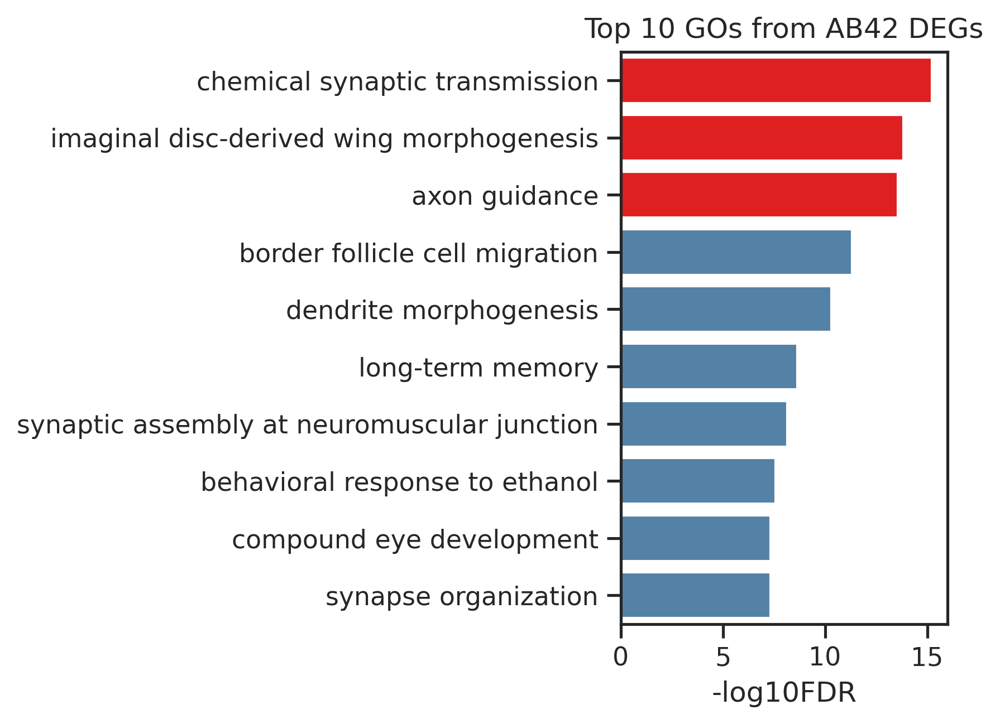

In [67]:
fig, ax = plt.subplots(figsize=(2.5, 4.5))
sns.barplot(data=ab42GO_Df_top10, x = '-log10FDR', y = 'name', ax=ax, width=0.8, color='steelblue', 
            palette=['red' if name in overlapGO_L else 'steelblue' for name in ab42GO_Df_top10.name])
plt.ylabel('')
plt.title('Top 10 GOs from AB42 DEGs')
plt.savefig(f'{figure3PicFolder}/barplot_GO_ab42GO_Df_top10.pdf', bbox_inches='tight')

plt.show()

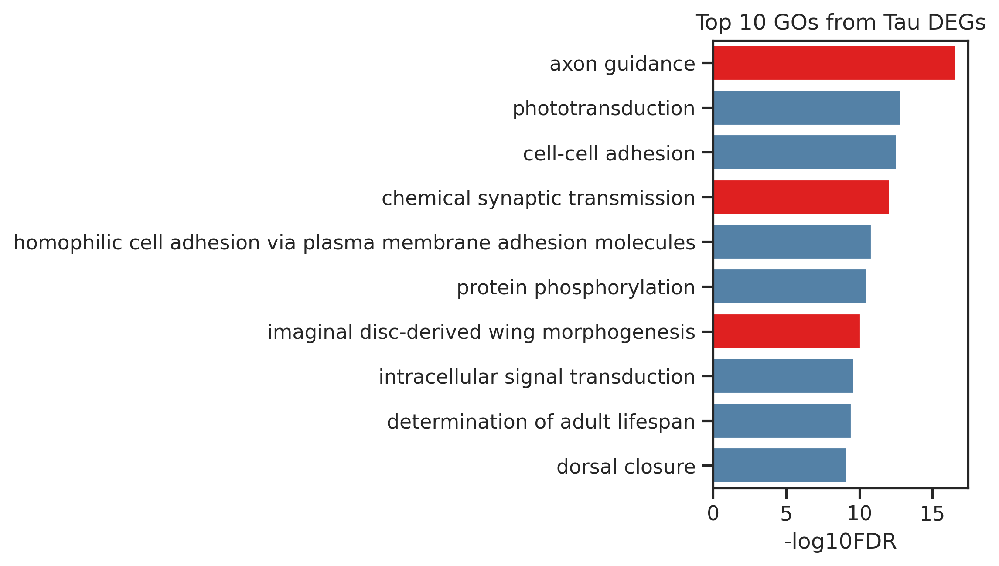

In [68]:
fig, ax = plt.subplots(figsize=(2.5, 4.5))
sns.barplot(data=tauGO_Df_top10, x = '-log10FDR', y = 'name', ax=ax, width=0.8, color='steelblue', 
            palette=['red' if name in overlapGO_L else 'steelblue' for name in tauGO_Df_top10.name])
plt.ylabel('')
plt.title('Top 10 GOs from Tau DEGs')
plt.savefig(f'{figure3PicFolder}/barplot_GO_tauGO_Df_top10.pdf', bbox_inches='tight')

plt.show()

In [69]:
ab42GO_Df_top10.to_csv(f'{figure3Folder}/ab42GO_Df_top10.csv', index=False)
tauGO_Df_top10.to_csv(f'{figure3Folder}/tauGO_Df_top10.csv', index=False)

# Finish